In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/creditcardfraud/creditcard.csv


# FRAUD DETECTION

## 1. In the Problem statement, it has been asked to apply different techniques for Credit Card Fraud Detection and comparing different models. 

We will implement ***Logistic Regression, Random Forest, Neural Network*** algorithms. Also visualize performances of the models using ***Seaborn, Matplotlib***.

As, it has been advised that the data is imbalanced, we'll be measuring the accuracy from the Area Under the Precision-Recall Curve(AUC), as confusion matrix will not be meaningful.

Content:
* Dataset: Transactions made by European cardholders in September 2013.
* Duration: Two days, with 492 frauds out of 284,807 transactions.
* Class Imbalance: Fraudulent transactions (positive class) account for 0.172% of all transactions.
* Features: Numerical input variables resulting from PCA transformation.

#### 1. 'Time': Seconds elapsed between each transaction and the first transaction.
#### 2. 'Amount': Transaction amount.
#### 3. 'Target': 'Class': Response variable, 1 for fraud, 0 otherwise.

#### 4. Exploratory Data Analysis & Data Cleaning

- Import Modules, Load Data & Data Review
- Exploratory Data Analysis
- Data Cleaning
    
#### 5. Data Preprocessing

- Scaling
- Train - Test Split

#### 6. Model Building

- Logistic Regression without SMOTE
- Apply SMOTE
- Logistic Regression with SMOTE
- Random Forest Classifier with SMOTE
- Neural Network

In [2]:
## Import Libraies

## import all main libraries automatically with pyforest
# !pip install pyforest
# !pip install pycaret[full]

# import pyforest

## main libraries
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.ticker as mticker

# !pip install squarify
import squarify as sq

import scipy.stats as stats
from scipy.cluster.hierarchy import linkage, dendrogram
import statsmodels.api as sm
import statsmodels.formula.api as smf
import datetime as dt
from datetime import datetime
# from pyclustertend import hopkins

## pre-processing
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.compose import make_column_transformer, ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer, KNNImputer

## feature Selection
from sklearn.feature_selection import SelectKBest, SelectPercentile, f_classif, f_regression, mutual_info_regression

## scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler

## regression/prediction
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor

## ann
from sklearn.neural_network import MLPRegressor

## classification
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree 
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier, plot_importance

## metrics
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve 
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score
from sklearn.metrics import silhouette_samples,silhouette_score, average_precision_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import auc

## model selection
from sklearn import model_selection
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold, KFold, cross_val_predict, train_test_split
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score, cross_validate

## MLearning
from sklearn.pipeline import make_pipeline, Pipeline
import optuna
from sklearn.naive_bayes import GaussianNB

## clevers
# !pip install -U pandas-profiling --user
import pandas_profiling
from pandas_profiling.report.presentation.flavours.html.templates import create_html_assets

import ipywidgets
from ipywidgets import interact
import missingno as msno 
# !pip install wordcloud
from wordcloud import WordCloud

# !pip install termcolor
import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored
from termcolor import cprint
# grey red green yellow blue magenta cyan white (on_grey ..)
# bold dark underline blink reverse concealed
# cprint("Have a first look to:","blue","on_grey", attrs=['bold'])

## plotly and cufflinks
import plotly 
import plotly.express as px
import cufflinks as cf
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

## Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

## Figure&Display options
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning:

The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.0-CAPI-1.16.0). Conversions between both will be slow.



In [3]:
## Some Useful User-Defined-Functions

###############################################################################

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", 'yellow', attrs=['bold']), df.shape,'\n', 
          colored('*'*100, 'red', attrs=['bold']),
          colored("\nInfo:\n",'yellow', attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", 'yellow', attrs=['bold']), df.nunique(),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", 'yellow', attrs=['bold']), missing_values(df),'\n', 
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", 'yellow', attrs=['bold']), *list(df.columns), sep='\n- ') 
    print(colored('*'*100, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')
    
    print(colored("Columns after rename:", 'yellow', attrs=['bold']), *list(df.columns), sep='\n- ')
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    
###############################################################################
## To view summary information about the columns

def summary(column):
    print(colored("Column: ",'yellow', attrs=['bold']), column)
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing values: ", 'yellow', attrs=['bold']), df[column].isnull().sum())
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing values(%): ", 'yellow', attrs=['bold']), round(df[column].isnull().sum()/df.shape[0]*100, 2))
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Unique values: ", 'yellow', attrs=['bold']), df[column].nunique())
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Value counts: \n", 'yellow', attrs=['bold']), df[column].value_counts(dropna = False), sep='')
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    
###############################################################################
                    
def multicolinearity_control(df):                    
    df_temp = df.corr()
    count = 'Done'
    feature =[]
    collinear= []
    for col in df_temp.columns:
        for i in df_temp.index:
            if abs(df_temp[col][i] > .8 and df_temp[col][i] < 1):
                    feature.append(col)
                    collinear.append(i)
                    cprint(f"multicolinearity alert in between {col} - {i}", "red", attrs=["bold"])
    else:
        cprint(f"There is NO multicollinearity between the features.", "blue", attrs=["bold"])                     
                    
###############################################################################

def duplicate_values(df):
    print(colored("Duplicate check...", 'yellow', attrs=['bold']), sep='')
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored(" Duplicates were dropped!"),'\n',
              colored('*'*100, 'red', attrs=['bold']), sep='')
    else:
        print(colored("There are no duplicates"),'\n',
              colored('*'*100, 'red', attrs=['bold']), sep='')     

###############################################################################
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('Missing value control...', 'yellow', attrs=['bold']),'\n',
              colored('If there is a missing value above the limit you have given, the relevant columns are dropped and an information is given.'), sep='')

###############################################################################

def drop_null(df, limit):
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'were null and dropped')
            df.drop(i, axis=1, inplace=True)
    print(colored('Last shape after missing value control:', 'yellow', attrs=['bold']), df.shape, '\n', 
          colored('*'*100, 'red', attrs=['bold']), sep='')

###############################################################################

def shape_control():
    print('df.shape:', df.shape)
    print('X.shape:', X.shape)
    print('y.shape:', y.shape)
    print('X_train.shape:', X_train.shape)
    print('y_train.shape:', y_train.shape)
    print('X_test.shape:', X_test.shape)
    print('y_test.shape:', y_test.shape)

###############################################################################  

## show values in bar graphic
def show_values_on_bars(axs):
    def _show_on_single_plot(ax):        
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()
            value = '{:.2f}'.format(p.get_height())
            ax.text(_x, _y, value, ha="center") 
    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)
        
############################################################################### 

'''This function detects the best z-score for outlier detection in the specified column.'''

def outlier_zscore(df, col, min_z=1, max_z = 5, step = 0.05, print_list = False):
    z_scores = stats.zscore(df[col].dropna())
    threshold_list = []
    
    for threshold in np.arange(min_z, max_z, step):
        threshold_list.append((threshold, len(np.where(z_scores > threshold)[0])))
    
    df_outlier = pd.DataFrame(threshold_list, columns = ['threshold', 'outlier_count'])
    df_outlier['pct'] = (df_outlier.outlier_count - df_outlier.outlier_count.shift(-1))/df_outlier.outlier_count*100
    df_outlier['pct'] = df_outlier['pct'].apply(lambda x : x-100 if x == 100 else x)
    best_treshold = round(df_outlier.iloc[df_outlier.pct.argmax(), 0],2)
    IQR_coef = round((best_treshold - 0.675) / 1.35, 2)
    outlier_limit = int(df[col].dropna().mean() + (df[col].dropna().std()) * df_outlier.iloc[df_outlier.pct.argmax(), 0])
    num_outlier = df_outlier.iloc[df_outlier.pct.argmax(), 1]
    percentile_threshold = stats.percentileofscore(df[col].dropna(), outlier_limit)
    plt.plot(df_outlier.threshold, df_outlier.outlier_count)
    plt.vlines(best_treshold, 0, df_outlier.outlier_count.max(), colors="r", ls = ":")
    plt.annotate("Zscore : {}\nIQR_coef : {}\nValue : {}\nNum_outlier : {}\nPercentile : {}".format(best_treshold,
                                                                          IQR_coef,
                                                                          outlier_limit,
                                                                          num_outlier,     
                                                                          (np.round(percentile_threshold, 3), 
                                                                           np.round(100-percentile_threshold, 3))),
                                                                          (best_treshold, df_outlier.outlier_count.max()/2))
    plt.show()
    if print_list:
        print(df_outlier)
    return (plt, df_outlier, best_treshold, IQR_coef, outlier_limit, num_outlier, percentile_threshold)

############################################################################### 

'''This function plots histogram, boxplot and z-score/outlier graphs for the specified column.'''

def outlier_inspect(df, col, min_z = 1, max_z = 5, step = 0.05, max_hist = None, bins = 50):
    fig = plt.figure(figsize=(20, 6))
    fig.suptitle(col, fontsize=16)
    plt.subplot(1,3,1)
    if max_hist == None:
        sns.distplot(df[col], kde=False, bins = 50)
    else :
        sns.distplot(df[df[col]<=max_hist][col], kde=False, bins = 50)
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    z_score_inspect = outlier_zscore(df, col, min_z = min_z, max_z = max_z, step = step)
    plt.show()
    
############################################################################### 

"""This function gives max/min threshold, number of data, number of outlier and plots its boxplot,
according to the tree type and the entered z-score value for the relevant column."""

def num_outliers(df, col, whis = 1.5):
    q1 = df.groupby("class")[col].quantile(0.25)
    q3 = df.groupby("class")[col].quantile(0.75)
    iqr = q3 - q1
    print("Column_name :", col)
    print("whis :", whis)
    print("-------------------------------------------")
    for i in np.sort(df['class'].unique()):
        min_threshold = q1.loc[i] - whis*iqr.loc[i]
        max_threshold = q3.loc[i] + whis*iqr.loc[i]
        print("min_threshold:", min_threshold, "\nmax_threshold:", max_threshold)
        num_outliers = len(df[df["class"]==i][col][(df[col]<min_threshold) | (df[col]>max_threshold)])
        print(f"Num_of_values for {i} :", len(df[df["class"]==i]))
        print(f"Num_of_outliers for {i} :", num_outliers)
        print("-------------------------------------------")
    return sns.boxplot(y = df[col], x = df["class"], whis=whis)

############################################################################### 

"""This function assigns the NaN-value first and then drop related rows, according to the tree type and the entered
whis value and plots the boxplot for the relevant column. """

def remove_outliers(df, col, whis=1.5):
    q1 = df.groupby("class")[col].quantile(0.25)
    q3 = df.groupby("class")[col].quantile(0.75)
    iqr = q3 - q1
    for i in np.sort(df['class'].unique()):
        min_threshold = q1.loc[i] - whis*iqr.loc[i]
        max_threshold = q3.loc[i] + whis*iqr.loc[i]
        df.loc[((df["class"]==i) & ((df[col]<min_threshold) | (df[col]>max_threshold))), col] = np.nan
    return sns.boxplot(y = df[col], x = df["class"], whis=whis)

############################################################################### 

Let's first load the required creditcard dataset.

In [4]:
# df0 = pd.read_csv('creditcard.csv')
df0=pd.read_csv('../input/creditcardfraud/creditcard.csv')
df = df0.copy()
df.head(3) 

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620,0
1,0.000,1.192,0.266,0.166,0.448,0.060,-0.082,-0.079,0.085,-0.255,-0.167,1.613,1.065,0.489,-0.144,0.636,0.464,-0.115,-0.183,-0.146,-0.069,-0.226,-0.639,0.101,-0.340,0.167,0.126,-0.009,0.015,2.690,0
2,1.000,-1.358,-1.340,1.773,0.380,-0.503,1.800,0.791,0.248,-1.515,0.208,0.625,0.066,0.717,-0.166,2.346,-2.890,1.110,-0.121,-2.262,0.525,0.248,0.772,0.909,-0.689,-0.328,-0.139,-0.055,-0.060,378.660,0


In [5]:
df.tail(3)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284804,172788.000,1.920,-0.301,-3.250,-0.558,2.631,3.031,-0.297,0.708,0.432,-0.485,0.412,0.063,-0.184,-0.511,1.329,0.141,0.314,0.396,-0.577,0.001,0.232,0.578,-0.038,0.640,0.266,-0.087,0.004,-0.027,67.880,0
284805,172788.000,-0.240,0.530,0.703,0.690,-0.378,0.624,-0.686,0.679,0.392,-0.399,-1.934,-0.963,-1.042,0.450,1.963,-0.609,0.510,1.114,2.898,0.127,0.265,0.800,-0.163,0.123,-0.569,0.547,0.109,0.105,10.000,0
284806,172792.000,-0.533,-0.190,0.703,-0.506,-0.013,-0.650,1.577,-0.415,0.486,-0.915,-1.040,-0.032,-0.188,-0.084,0.041,-0.303,-0.660,0.167,-0.256,0.383,0.261,0.643,0.377,0.009,-0.474,-0.818,-0.002,0.014,217.000,0


In [6]:
df.sample(3)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
88931,62352.000,0.041,-2.920,0.470,-0.061,-1.824,1.132,-0.605,0.345,-0.132,0.194,1.272,0.397,-0.446,-0.429,-0.746,0.446,1.050,-1.772,0.289,1.197,0.471,0.170,-0.473,-0.239,-0.033,-0.265,-0.034,0.113,614.960,0
15085,26432.000,-0.734,0.508,1.545,-1.414,-0.010,-0.624,0.437,0.176,-0.111,-0.539,0.756,0.044,-0.955,0.318,-0.061,0.938,-0.992,0.381,-0.269,0.063,-0.043,-0.220,-0.052,0.003,-0.348,0.725,0.238,0.162,21.000,0
89468,62590.000,-0.465,0.578,-0.262,0.219,2.219,4.024,0.471,0.936,-0.460,-0.090,-0.624,-0.149,-0.200,0.145,0.163,-0.579,-0.154,0.257,1.430,0.502,-0.059,-0.157,0.015,1.003,0.181,-0.241,0.381,0.208,109.250,0


<a id="4"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">4 - DATA CLEANING & EXPLORATORY DATA ANALYSIS (EDA)<p>

**Exploratory Data Analysis is an initial process of analysis, in which we can summarize characteristics of data such as pattern, trends, outliers, and hypothesis testing using descriptive statistics and visualization.**

In [7]:
first_looking(df)
duplicate_values(df)
drop_columns(df, [])
drop_null(df, 90)
# df.describe().T

Shape:(284807, 31)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 1

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
time,283726.000,94811.078,47481.048,0.000,54204.750,84692.500,139298.000,172792.000
v1,283726.000,0.006,1.948,-56.408,-0.916,0.020,1.316,2.455
v2,283726.000,-0.004,1.647,-72.716,-0.600,0.064,0.800,22.058
v3,283726.000,0.002,1.509,-48.326,-0.890,0.180,1.027,9.383
v4,283726.000,-0.003,1.414,-5.683,-0.850,-0.022,0.740,16.875
v5,283726.000,0.002,1.377,-113.743,-0.690,-0.053,0.612,34.802
v6,283726.000,-0.001,1.332,-26.161,-0.769,-0.275,0.397,73.302
v7,283726.000,0.002,1.228,-43.557,-0.553,0.041,0.570,120.589
v8,283726.000,-0.001,1.179,-73.217,-0.209,0.022,0.326,20.007
v9,283726.000,-0.002,1.095,-13.434,-0.644,-0.053,0.596,15.595


***According to the basic examinations on the dataset;***

- We have a classification problem.
- We are going to make classification on the target variable "class".
- And we will build a model to get the best classification on the "class" column.
- Because of that we are going to look at the balance of "class" column.
- The dataset has 31 columns and 283726 observations after dropping of duplicated observations.
- All columns contain numerical values. 
- There seems to be no missing value. 

<a id="4.2"></a>
### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Examination of Features and Data Insights<p>
    
**In the given dataset, feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise. So, we can divide data into two groups and compare their characteristics. Here, we can find the average of both the groups using groupby() and mean() function.**   

'class' Column-Target Column

In [9]:
cprint('Have a first look to "class" column',"green","on_red", attrs=["bold"])
print("-----"*10)
summary('class')

Have a first look to "class" column
--------------------------------------------------
Column:  class
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  2
****************************************************************************************************
Value counts: 
0    283253
1       473
Name: class, dtype: int64
****************************************************************************************************


In [10]:
cprint('Mean values according to the "class" column','green', 'on_red')
df.groupby('class').mean()

Mean values according to the "class" column


,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount
class,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,94835.058,0.013,-0.010,0.013,-0.010,0.007,0.001,0.010,-0.002,0.003,0.008,-0.006,0.009,0.001,0.012,0.001,0.008,0.011,0.005,-0.001,-0.000,-0.001,-0.000,0.000,0.000,-0.000,0.000,0.001,0.000,88.414
1,80450.514,-4.498,3.406,-6.730,4.473,-2.957,-1.433,-5.176,0.953,-2.522,-5.453,3.716,-6.103,-0.094,-6.836,-0.073,-4.001,-6.463,-2.157,0.669,0.405,0.467,0.087,-0.096,-0.107,0.041,0.050,0.214,0.078,123.872


In [11]:
cprint('Descriptive statistics according to the "class==0, Non-Fraudulent"',"green","on_red", attrs=["bold"])
df[df['class'] == 1].describe().T.style.background_gradient(subset = ['mean','min','50%', 'max'], cmap = 'RdPu')

Descriptive statistics according to the "class==0, Non-Fraudulent"


,count,mean,std,min,25%,50%,75%,max
time,473.000000,80450.513742,48636.179973,406.000000,41203.000000,73408.000000,129095.000000,170348.000000
v1,473.000000,-4.498280,6.593145,-30.552380,-5.603690,-2.271755,-0.361428,2.132386
v2,473.000000,3.405965,4.122500,-8.402154,1.145381,2.617105,4.571743,22.057729
v3,473.000000,-6.729599,6.909647,-31.103685,-7.926507,-4.875397,-2.171454,2.250210
v4,473.000000,4.472591,2.871523,-1.313275,2.288644,4.100098,6.290918,12.114672
v5,473.000000,-2.957197,5.278831,-22.105532,-4.278983,-1.372245,0.260821,11.095089
v6,473.000000,-1.432518,1.715347,-6.406267,-2.450444,-1.420468,-0.413647,6.474115
v7,473.000000,-5.175912,6.858024,-43.557242,-6.989195,-2.902079,-0.907188,5.802537
v8,473.000000,0.953255,5.585950,-41.044261,-0.161518,0.617738,1.709417,20.007208
v9,473.000000,-2.522124,2.465047,-13.434066,-3.796760,-2.099049,-0.788388,3.353525


In [12]:
cprint('Descriptive statistics according to the "class==1, Fraudulent"',"green","on_red", attrs=["bold"])
df[df['class'] == 0].describe().T.style.background_gradient(subset = ['mean','min','50%', 'max'], cmap = 'RdPu')

Descriptive statistics according to the "class==1, Fraudulent"


,count,mean,std,min,25%,50%,75%,max
time,283253.000000,94835.058093,47475.550607,0.000000,54233.000000,84711.000000,139308.000000,172792.000000
v1,283253.000000,0.013439,1.922179,-56.407510,-0.913431,0.022562,1.316788,2.454930
v2,283253.000000,-0.009829,1.633520,-72.715728,-0.601398,0.062561,0.797012,18.902453
v3,283253.000000,0.012853,1.457593,-48.325589,-0.883966,0.182247,1.028261,9.382558
v4,283253.000000,-0.010440,1.398575,-5.683171,-0.851605,-0.024500,0.734231,16.875344
v5,283253.000000,0.006769,1.355816,-113.743307,-0.687888,-0.052807,0.612442,34.801666
v6,283253.000000,0.001251,1.329914,-26.160506,-0.767543,-0.274172,0.397678,73.301626
v7,283253.000000,0.010447,1.177480,-31.764946,-0.550146,0.041664,0.571029,120.589494
v8,283253.000000,-0.002448,1.157140,-73.216718,-0.208841,0.021633,0.324473,18.709255
v9,283253.000000,0.002613,1.086902,-6.290730,-0.641649,-0.051368,0.596969,15.594995


In [13]:
fig = px.pie(df, values = df['class'].value_counts(), 
             names = (df['class'].value_counts()).index, 
             title = '"class" Column Distribution')
fig.show()

In [14]:
y = df['class']
print(f'Percentage of class-1: % {round(y.value_counts(normalize=True)[1]*100,2)} --> \
({y.value_counts()[1]} observations for class-1)\nPercentage of class-0: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} observations for class-0)')

Percentage of class-1: % 0.17 --> (473 observations for class-1)
Percentage of class-0: % 99.83 --> (283253 observations for class-0)


- 'class' column has binary type values.
- We have an imbalanced data. Class frequencies of the target variable are quite imbalanced.
- Almost 0.17 % of the transactions are fraudulent(473).
- Almost 99.83 % of the transactions are non-fraudulent(283253).

**'time' Column**

- Time: This feature is contains the seconds elapsed between each transaction and the first transaction in the dataset.

In [15]:
cprint("Have a First Look to 'time' Column","green","on_red", attrs=["bold"])
print("-----"*10)
summary('time')

Have a First Look to 'time' Column
--------------------------------------------------
Column:  time
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  124592
****************************************************************************************************
Value counts: 
3767.000      21
3770.000      20
19912.000     19
3750.000      19
73885.000     17
              ..
127732.000     1
62217.000      1
127739.000     1
127741.000     1
172792.000     1
Name: time, Length: 124592, dtype: int64
****************************************************************************************************


In [16]:
cprint("Describe Values of Column 'time'","green","on_red", attrs=["bold"])
df.time.describe()

Describe Values of Column 'time'


count   283726.000
mean     94811.078
std      47481.048
min          0.000
25%      54204.750
50%      84692.500
75%     139298.000
max     172792.000
Name: time, dtype: float64

In [17]:
fig = px.box(df, x = df['time'], color = df['class'], title = 'Boxplot Of Column "time"')
fig.show()

**'amount' Column**

- Amount: This feature is the transaction Amount, can be used for example-dependant cost-senstive learning.

In [18]:
cprint("Have a First Look to 'amount' Column","green","on_red", attrs=["bold"])
print("-----"*10)
summary('time')

Have a First Look to 'amount' Column
--------------------------------------------------
Column:  time
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  124592
****************************************************************************************************
Value counts: 
3767.000      21
3770.000      20
19912.000     19
3750.000      19
73885.000     17
              ..
127732.000     1
62217.000      1
127739.000     1
127741.000     1
172792.000     1
Name: time, Length: 124592, dtype: int64
****************************************************************************************************


In [19]:
cprint("Describe Values of Column 'amount'","green","on_red", attrs=["bold"])
df.amount.describe()

Describe Values of Column 'amount'


count   283726.000
mean        88.473
std        250.399
min          0.000
25%          5.600
50%         22.000
75%         77.510
max      25691.160
Name: amount, dtype: float64

In [20]:
fig = px.box(df, x = df['amount'], color = df['class'], title = 'Boxplot Of Column "amount"')
fig.show()

**All 'v' Columns**

 Features from V1 to V28 are the principal components obtained with PCA.

**The dataset is too large. Let's take a look at how the distribution of class=1 and class=0 by quartiles is shaped.**

In [21]:
def transaction_transformer(price):
    if price <= 5.600:
        return 'Q-1'
    if 5.600 < price <= 22.700:
        return 'Q-2'
    if 22.700 < price <= 75.510:
        return 'Q-3'
    else:
        return 'Q-4'

In [22]:
df['transaction_class'] = df['amount'].apply(transaction_transformer)

In [23]:
fig = px.pie(df, values = df[df['class']==0]['transaction_class'].value_counts(), 
             names = df[df['class']==0]['transaction_class'].value_counts().index, 
             title = 'transaction_class & class==0 Distribution')
fig.show()

In [24]:
fig = px.pie(df, values = df[df['class']==1]['transaction_class'].value_counts(), 
             names = df[df['class']==1]['transaction_class'].value_counts().index, 
             title = 'transaction_class & class==1 Distribution')
fig.show()

In [25]:
print('Number of fraudulent transactions for Q-1      : ', df[(df['class']==1) & (df['transaction_class']=='Q-1')]['class'].sum())
print('Total amount of fraudulent transactions for Q-1: ', df[(df['class']==1) & (df['transaction_class']=='Q-1')]['amount'].sum())
print('Mean amount of fraudulent transactions for Q-1 : ', df[(df['class']==1) & (df['transaction_class']=='Q-1')]['amount'].mean())

Number of fraudulent transactions for Q-1      :  213
Total amount of fraudulent transactions for Q-1:  251.73000000000002
Mean amount of fraudulent transactions for Q-1 :  1.181830985915493


In [26]:
print('Number of fraudulent transactions for Q-2      : ', df[(df['class']==1) & (df['transaction_class']=='Q-2')]['class'].sum())
print('Total amount of fraudulent transactions for Q-2: ', df[(df['class']==1) & (df['transaction_class']=='Q-2')]['amount'].sum())
print('Mean amount of fraudulent transactions for Q-2 : ', df[(df['class']==1) & (df['transaction_class']=='Q-2')]['amount'].mean())

Number of fraudulent transactions for Q-2      :  49
Total amount of fraudulent transactions for Q-2:  591.53
Mean amount of fraudulent transactions for Q-2 :  12.07204081632653


In [27]:
print('Number of fraudulent transactions for Q-3      : ', df[(df['class']==1) & (df['transaction_class']=='Q-3')]['class'].sum())
print('Total amount of fraudulent transactions for Q-3: ', df[(df['class']==1) & (df['transaction_class']=='Q-3')]['amount'].sum())
print('Mean amount of fraudulent transactions for Q-3 : ', df[(df['class']==1) & (df['transaction_class']=='Q-3')]['amount'].mean())

Number of fraudulent transactions for Q-3      :  41
Total amount of fraudulent transactions for Q-3:  1733.79
Mean amount of fraudulent transactions for Q-3 :  42.28756097560975


In [28]:
print('Number of fraudulent transactions for Q-4      : ', df[(df['class']==1) & (df['transaction_class']=='Q-4')]['class'].sum())
print('Total amount of fraudulent transactions for Q-4: ', df[(df['class']==1) & (df['transaction_class']=='Q-4')]['amount'].sum())
print('Mean amount of fraudulent transactions for Q-4 : ', df[(df['class']==1) & (df['transaction_class']=='Q-4')]['amount'].mean())

Number of fraudulent transactions for Q-4      :  170
Total amount of fraudulent transactions for Q-4:  56014.34
Mean amount of fraudulent transactions for Q-4 :  329.4961176470589


In [29]:
df.drop(['transaction_class'], axis = 1, inplace = True)

- As seen above, there are fraudulent transactions in every quarter. 
- Q-1 has the highest number of transactions with 213 transactions.
- Q-4 has the highest amount with 56014.34 amount.

Let's look the correlation and multicollinearity among the features.

Heatmap of df
--------------------------------------------------


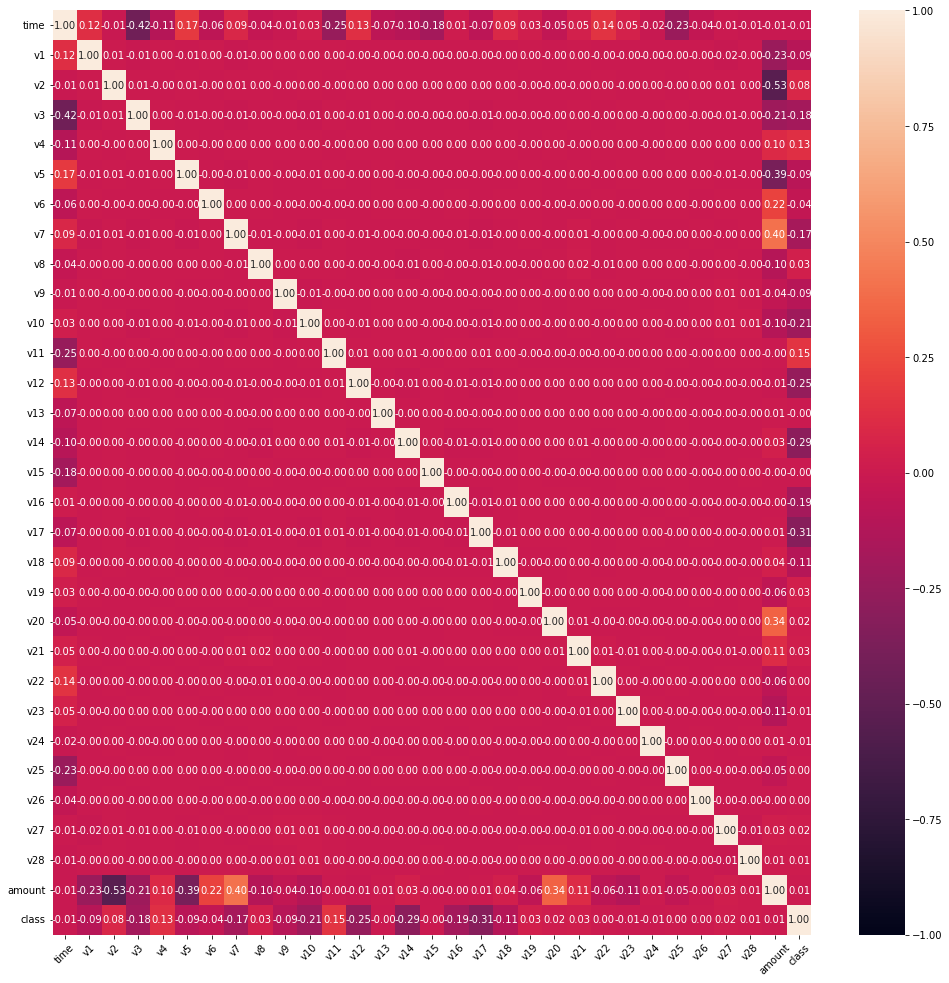

In [30]:
cprint("Heatmap of df",'green', 'on_red', attrs=["bold"])
print("-----"*10)
plt.figure(figsize = (17, 17))
sns.heatmap (df.corr(), annot = True, fmt = '.2f', vmin = -1, vmax = 1)
plt.xticks(rotation = 45);

In [31]:
multicolinearity_control(df)

There is NO multicollinearity between the features.


In [32]:
df.corr()['class'].sort_values().drop('class').iplot(kind = 'barh', title = 'Correlation Between the Columns');

***Based on the examinations made above,***

- There is no multicollinearity problem among the features.
- We have weak level correlation between the features and the target column.
- Also there is weak level correlation between the columns.

<a id="4.3"></a>
### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">4.3 Data Cleaning<p>

Check Missing Values and Outliers

In [33]:
cprint("Missing Values","green","on_red", attrs=["bold"])
missing_values(df)

Missing Values


,Missing_Number,Missing_Percent


- There seems to be no missing value.

What about the outliers?

Boxplots


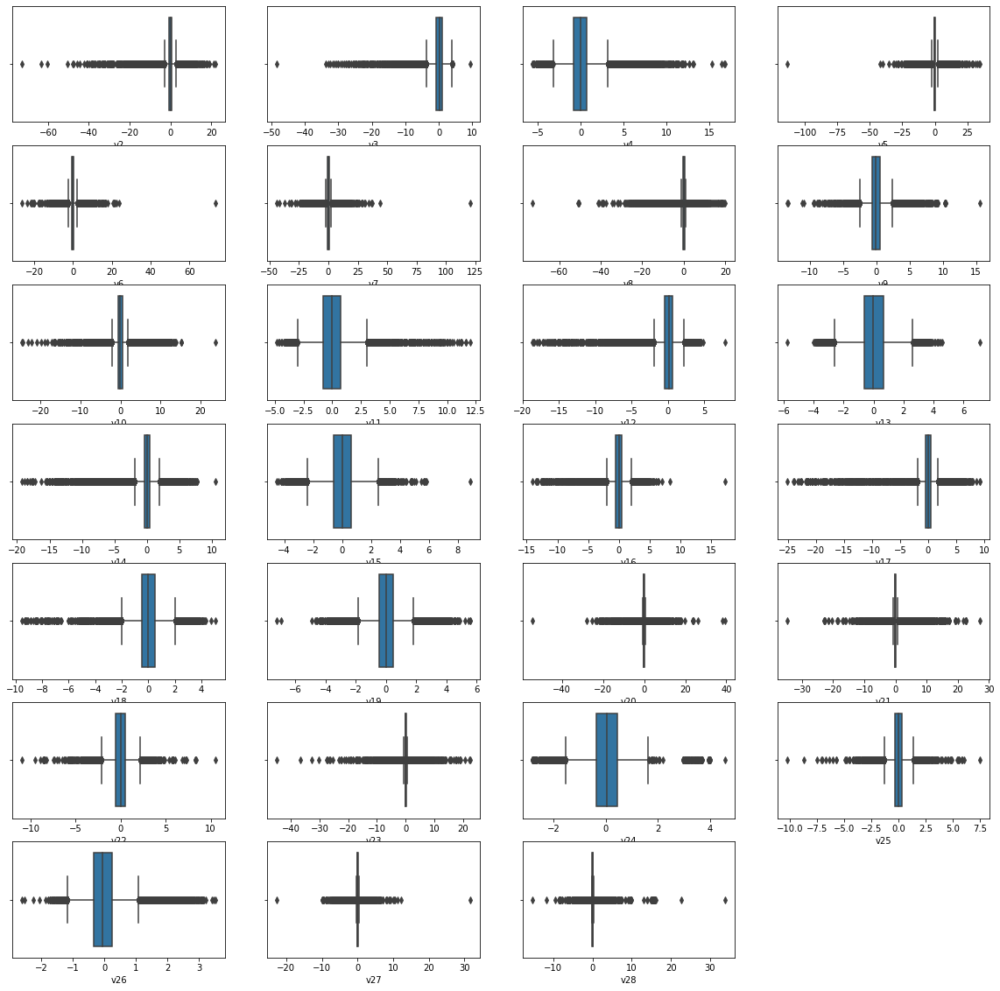

In [34]:
cprint("Boxplots","green","on_red", attrs=["bold"])
%matplotlib inline
index = 0
plt.figure(figsize=(20,20))
for feature in df.columns[2:29]:
    index += 1
    plt.subplot(7,4,index)
    sns.boxplot(x=feature, data=df, whis=1.5)

Boxplots


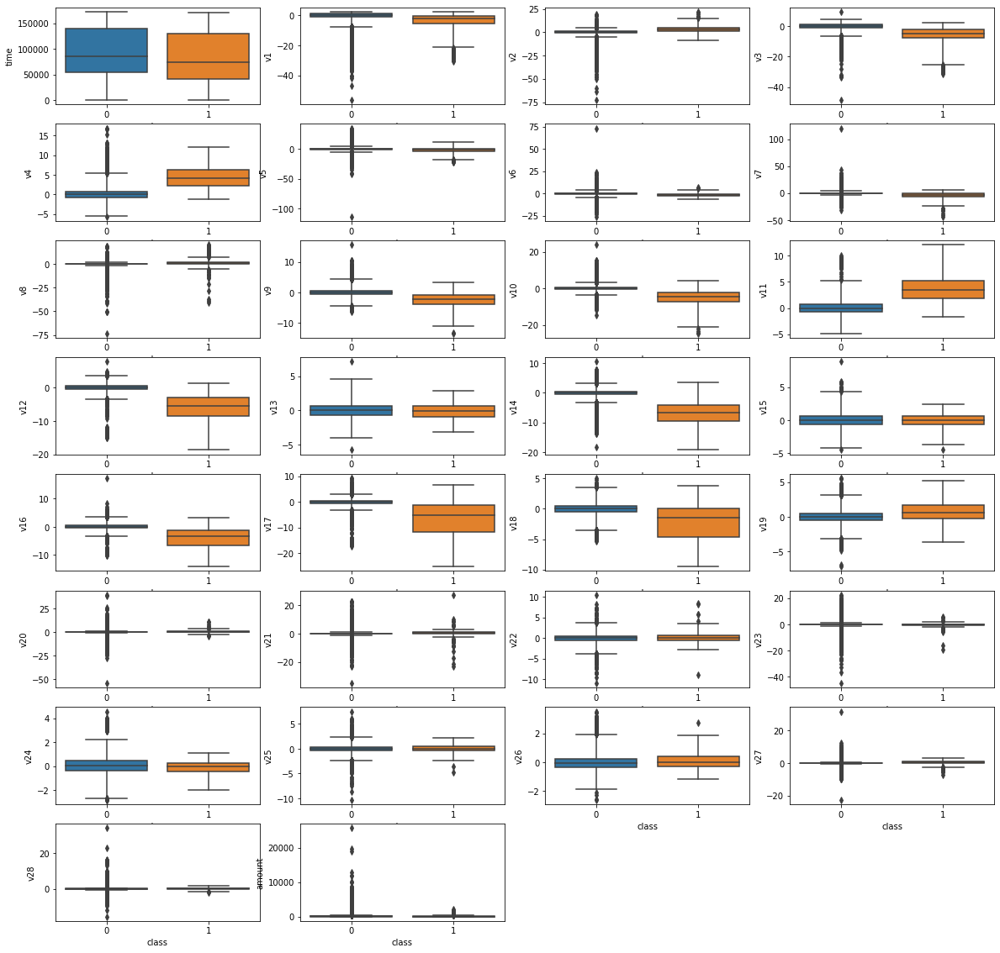

In [35]:
cprint("Boxplots","green","on_red", attrs=["bold"])
index = 0
plt.figure(figsize=(20,20))
for feature in df.columns[:30]:
    index += 1
    plt.subplot(8,4,index)
    sns.boxplot(y = feature, x = "class", data = df, whis=3)

In [36]:
from scipy.stats import zscore
from scipy import stats
from numpy import percentile

- 'outlier_zscore' function detects the best z-score for outlier detection in the specified column.
- 'outlier_inspect' function plots histogram, boxplot and z-score/outlier graphs for the specified column.

Outlier Inspection


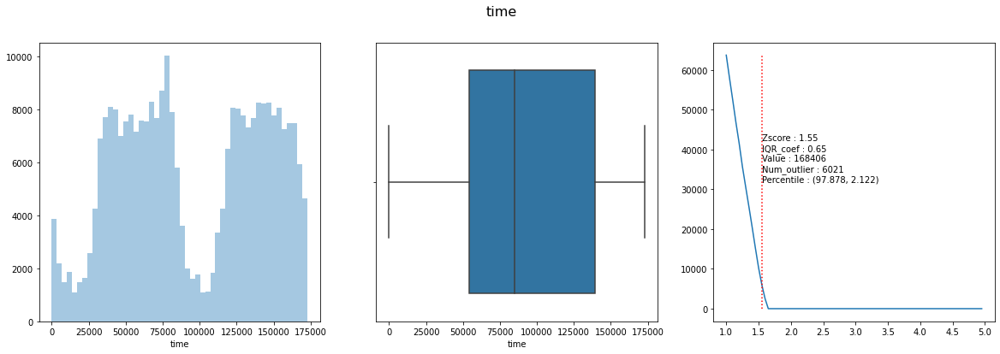

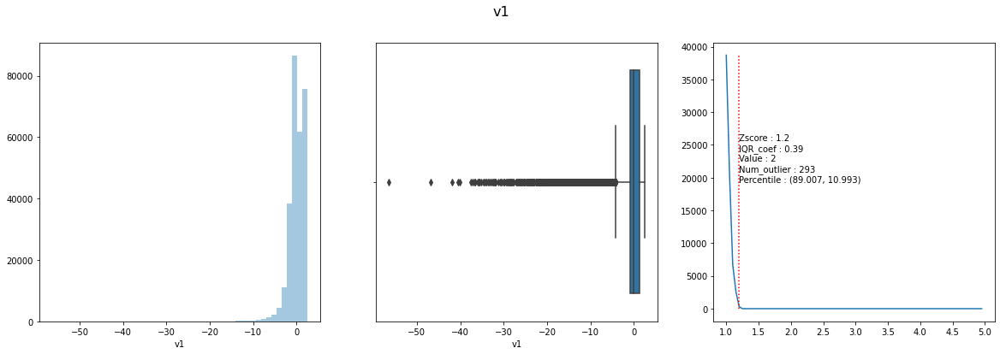

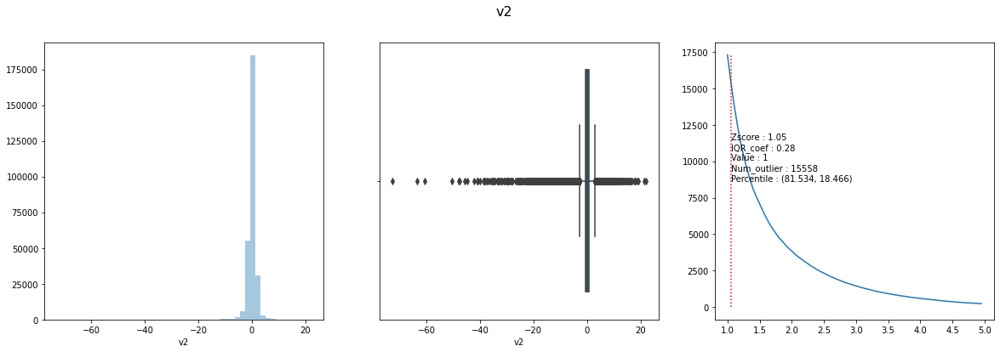

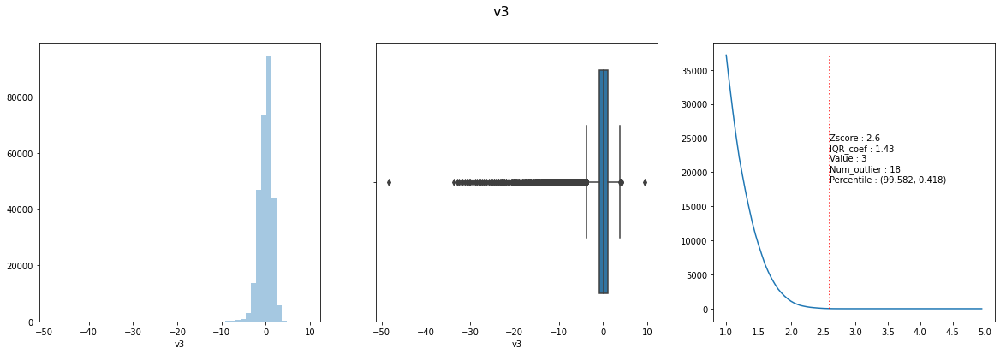

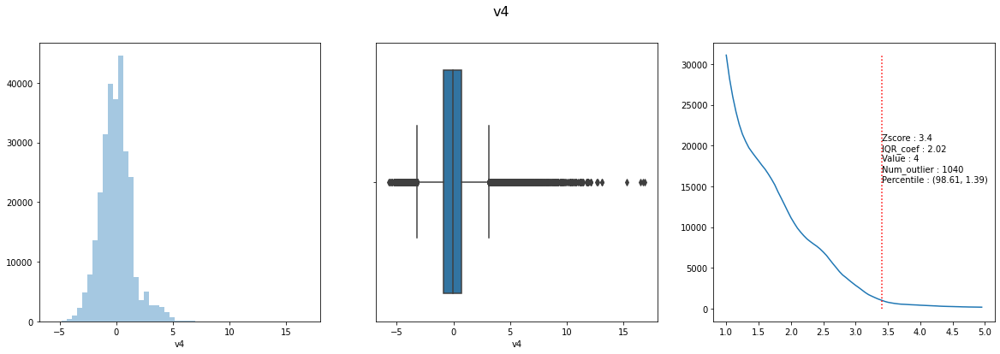

...

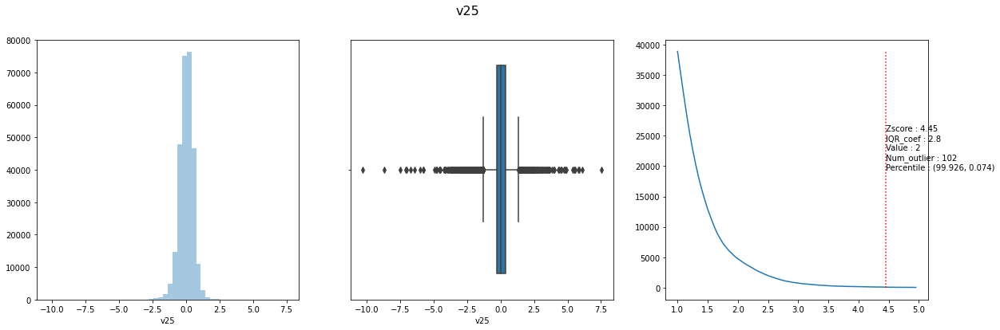

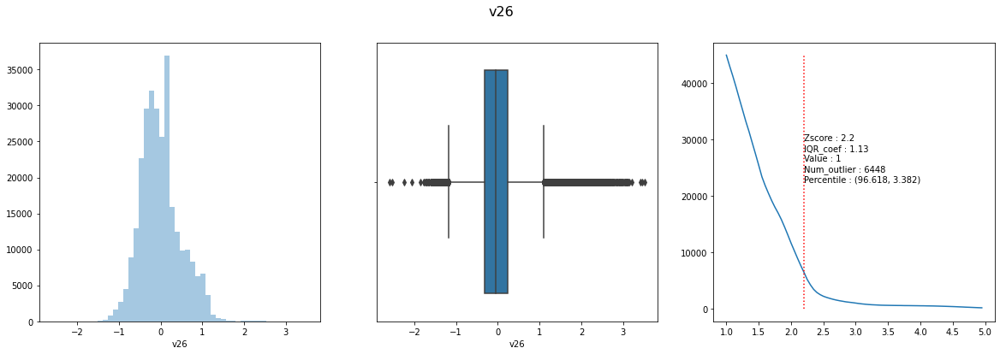

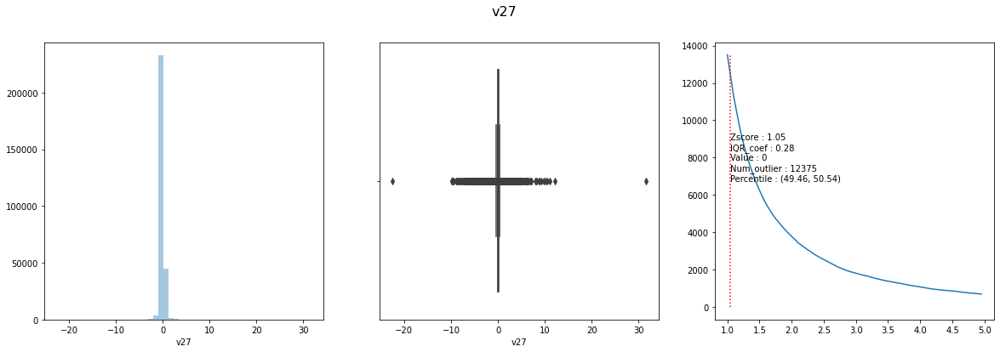

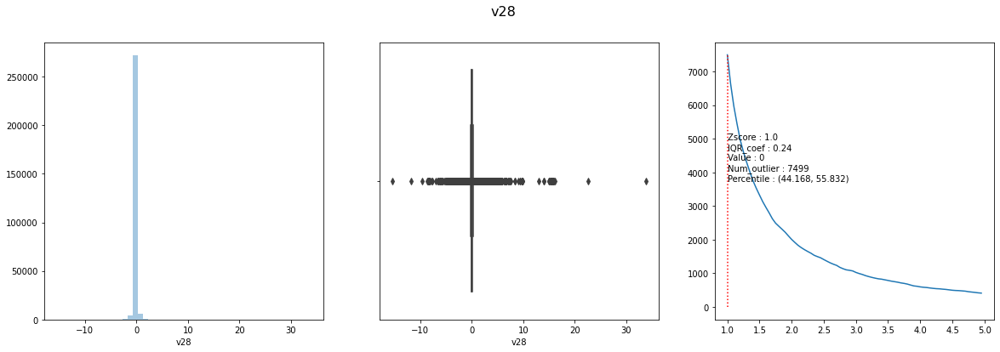

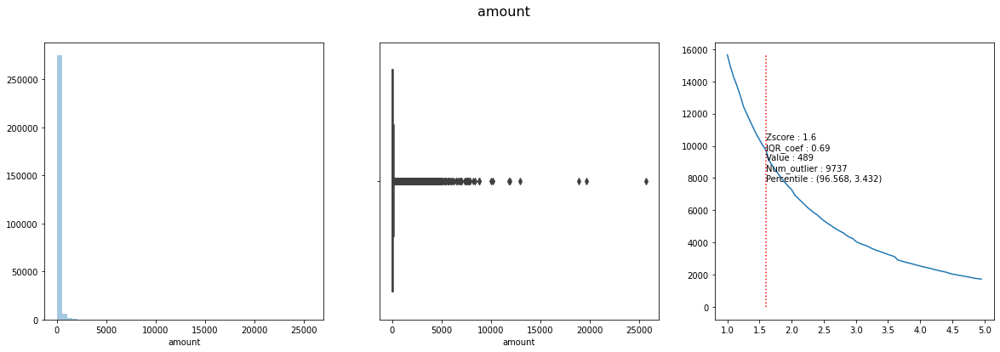

In [37]:
cprint("Outlier Inspection","green","on_red", attrs=["bold"])
for col in df.columns[:30]:
    outlier_inspect(df, col)

**Evaluation**

1. There is no missing value in this data set.
2. When each feature is examined, although it is seen that there are outliers in the boxplots, it is evaluated that this dataset does not actually have an outlier.
3. However, since it was considered that the data with a z-score value above 4.73 (IQR_coef = 3) according to the class type would adversely affect the model, so I decided to assign the Nan-Value to these data first and then drop them.

In [38]:
IQR_coef = 3
z_score = round(0.675 + IQR_coef*1.35, 2)
z_score

4.73

In [39]:
z_score = 3
iqr_coef = round((z_score - 0.675) / 1.35, 2)
iqr_coef

1.72

Let's create a new df before outlier operation.

In [40]:
df_out = df.copy()

In [41]:
cprint("Shape of new df before outlier check",'green', 'on_red', attrs=["bold"])
df_out.shape

Shape of new df before outlier check


(283726, 31)

In [42]:
cprint("Value counts of 'class' column before outlier check",'green', 'on_red', attrs=["bold"])
df_out['class'].value_counts(dropna=False)

Value counts of 'class' column before outlier check


0    283253
1       473
Name: class, dtype: int64

In [43]:
cprint("Missing value control before outlier check",'green', 'on_red', attrs=["bold"])
missing_values(df_out)

Missing value control before outlier check


,Missing_Number,Missing_Percent


- 'num_outliers' function gives max/min threshold, number of data, number of outlier and plots its boxplot,
according to the tree type and the entered z-score value for the relevant column.
- We can see the number of outliers column by column below.

Column_name : time
whis : 3
-------------------------------------------
min_threshold: -200992.0 
max_threshold: 394533.0
Num_of_values for 0 : 283253
Num_of_outliers for 0 : 0
-------------------------------------------
min_threshold: -222473.0 
max_threshold: 392771.0
Num_of_values for 1 : 473
Num_of_outliers for 1 : 0
-------------------------------------------
Column_name : v1
whis : 3
-------------------------------------------
min_threshold: -7.604089690316541 
max_threshold: 8.007446923764526
Num_of_values for 0 : 283253
Num_of_outliers for 0 : 1870
-------------------------------------------
min_threshold: -21.330477603798716 
max_threshold: 15.365359485400905
Num_of_values for 1 : 473
Num_of_outliers for 1 : 19
-------------------------------------------
Column_name : v2
whis : 3
-------------------------------------------
min_threshold: -4.796627511937092 
max_threshold: 4.992241486644909
Num_of_values for 0 : 283253
Num_of_outliers for 0 : 4330
------------------------------

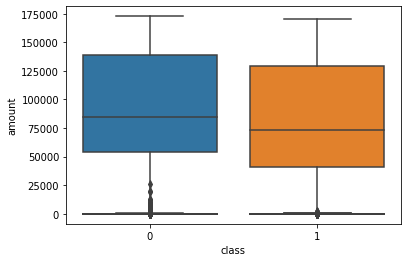

In [44]:
for col in df_out.columns[:30]:
    num_outliers(df_out, col, whis=3)

- 'remove_outliers' function assigns the NaN-value first and then drop related rows, according to the class and the entered
whis value and plots the boxplot for the relevant column.

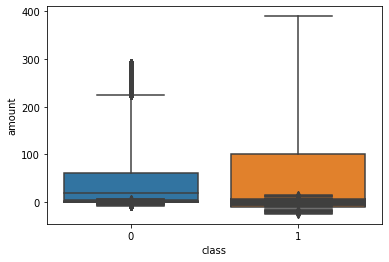

In [45]:
for col in df_out.columns[1:30]:
    remove_outliers(df_out, col, whis=3)

In [46]:
cprint("Missing value control after outlier check",'green', 'on_red', attrs=["bold"])
missing_values(df_out)

Missing value control after outlier check


,Missing_Number,Missing_Percent
amount,18803,0.066
v27,16129,0.057
v20,13191,0.046
v28,12311,0.043
v8,11085,0.039
v23,8067,0.028
v21,6784,0.024
v6,5395,0.019
v2,4342,0.015
v7,2831,0.010


In [47]:
df_out.dropna(inplace=True)

In [48]:
cprint("Missing value control after outlier check",'green', 'on_red', attrs=["bold"])
missing_values(df_out)

Missing value control after outlier check


,Missing_Number,Missing_Percent


In [49]:
cprint("Shape of new df after outlier check",'green', 'on_red', attrs=["bold"])
df_out.shape

Shape of new df after outlier check


(230994, 31)

In [50]:
cprint("Value counts of 'class' column after outlier check",'green', 'on_red', attrs=["bold"])
df_out['class'].value_counts(dropna=False)

Value counts of 'class' column after outlier check


0    230640
1       354
Name: class, dtype: int64

---
---


<a id="5"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5 - MODEL BUILDING WITHOUT SMOTE<p>

---------
This dataset is severely unbalanced (most of the transactions are non-fraud). 
    
We will make class prediction with three different algorithms. 
    
It is important that we can evaluate the effectiveness of SMOTE. For this reason, implement the Logistic Regression and Random Forest Classifier algorithms in two different ways, with SMOTE applied and without.

In [51]:
def eval(model, X_train, X_test):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    
    print(confusion_matrix(y_test, y_pred))
    print("Test_Set")
    print(classification_report(y_test,y_pred))
    print("Train_Set")
    print(classification_report(y_train,y_pred_train))
    print("---"*20)
    plot_confusion_matrix(model, X_test, y_test, cmap="plasma")

In [52]:
def train_val(y_train, y_train_pred, y_test, y_pred):
    
    scores = {"train_set": {"Accuracy" : accuracy_score(y_train, y_train_pred),
                            "Precision" : precision_score(y_train, y_train_pred),
                            "Recall" : recall_score(y_train, y_train_pred),                          
                            "f1" : f1_score(y_train, y_train_pred),
                            "roc_auc" : roc_auc_score(y_train, y_train_pred),
                            "recall_auc" : auc(recall, precision)},
    
              "test_set": {"Accuracy" : accuracy_score(y_test, y_pred),
                           "Precision" : precision_score(y_test, y_pred),
                           "Recall" : recall_score(y_test, y_pred),                          
                           "f1" : f1_score(y_test, y_pred),
                           "roc_auc" : roc_auc_score(y_test, y_pred),
                           "recall_auc" : auc(recall, precision)}}
    
    return pd.DataFrame(scores)

<a id="5.1"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5.1 Data Pre - Processing<p>

<a id="5.1.1"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.1.1 Scaling<p>

In [53]:
df_ml = df_out.copy()

In [54]:
scaler = StandardScaler()

df_ml["amount"] = scaler.fit_transform(df_ml["amount"].values.reshape(-1,1))
df_ml["time"] = scaler.fit_transform(df_ml["time"].values.reshape(-1,1))

<a id="5.1.2"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.1.2 Train - Test Split<p>

In [55]:
X = df_ml.drop(['class'], axis = 1)
y = df_ml['class']

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)

In [57]:
print('X_train.shape : ', X_train.shape)
print('X_test.shape  : ', X_test.shape)

X_train.shape :  (184795, 30)
X_test.shape  :  (46199, 30)


In [58]:
cprint('y_train.value_counts','green', 'on_red')
y_train.value_counts()

y_train.value_counts


0    184512
1       283
Name: class, dtype: int64

In [59]:
cprint('y_test.value_counts','green', 'on_red')
y_test.value_counts()

y_test.value_counts


0    46128
1       71
Name: class, dtype: int64

<a id="5.2"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5.2 Logistic Regression without SMOTE<p>

<a id="5.2.1"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.1 Model Building with Logistic Regression</p>

In [60]:
LogReg_model = LogisticRegression(solver='liblinear', class_weight = 'balanced', random_state = 42)
LogReg_model.fit(X_train, y_train)
y_pred = LogReg_model.predict(X_test)
y_train_pred = LogReg_model.predict(X_train)

<a id="5.2.2"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.2 Evaluating Model Performance</p>

In [61]:
LogReg_model_f1 = f1_score(y_test, y_pred)
LogReg_model_acc = accuracy_score(y_test, y_pred)
LogReg_model_recall = recall_score(y_test, y_pred)
LogReg_model_auc = roc_auc_score(y_test, y_pred)
LogReg_model_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
LogReg_model_recall_auc = auc(recall, precision)

LogReg_Model
------------------
[[44818  1310]
 [    3    68]]
Test_Set
              precision    recall  f1-score   support

           0       1.00      0.97      0.99     46128
           1       0.05      0.96      0.09        71

    accuracy                           0.97     46199
   macro avg       0.52      0.96      0.54     46199
weighted avg       1.00      0.97      0.98     46199

Train_Set
              precision    recall  f1-score   support

           0       1.00      0.97      0.99    184512
           1       0.05      0.93      0.09       283

    accuracy                           0.97    184795
   macro avg       0.52      0.95      0.54    184795
weighted avg       1.00      0.97      0.98    184795

------------------------------------------------------------


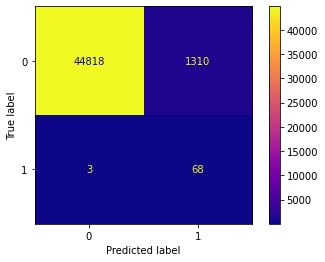

In [62]:
print("LogReg_Model")
print ("------------------")
eval(LogReg_model, X_train, X_test)

In [63]:
cprint('LogReg_model Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

LogReg_model Scores


,train_set,test_set
Accuracy,0.973,0.972
Precision,0.050,0.049
Recall,0.929,0.958
f1,0.094,0.094
roc_auc,0.951,0.965
recall_auc,0.504,0.504


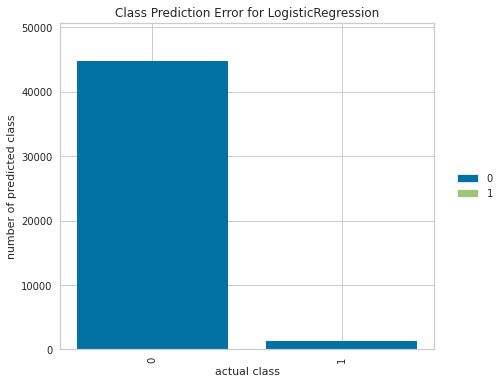

In [64]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(LogReg_model)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="5.2.3"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.3 Logistic Regression Cross Validation</p>

In [65]:
cprint('Cross Validation scores for Logistic Regression with default parameters','green', 'on_red')

LogReg_cv = LogisticRegression(solver='liblinear', class_weight = 'balanced', random_state = 42)
LogReg_cv_scores = cross_validate(LogReg_cv, X_train, y_train, 
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
LogReg_cv_scores = pd.DataFrame(LogReg_cv_scores, index = range(1, 11))
LogReg_cv_scores.mean()[2:]

Cross Validation scores for Logistic Regression with default parameters


test_accuracy    0.973
test_precision   0.048
test_recall      0.901
test_f1          0.092
test_roc_auc     0.978
dtype: float64

<a id="5.2.4"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.4 Logistic Regression GridSearchCV</p>

In [66]:
param_grid = { "class_weight" : ["balanced", None],
              'penalty': ["l1","l2"],
              'solver' : ['saga','lbfgs'],
              }

In [67]:
LogReg_grid = LogisticRegression(class_weight = 'balanced', random_state = 42)
LogReg_grid_model = GridSearchCV(LogReg_grid, param_grid, scoring = "f1", verbose = 2, n_jobs = -1).fit(X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  1.6min finished


In [68]:
print(colored('\033[1mBest Estimators of GridSearchCV for Logistic Regression Model:\033[0m', 'blue'), colored(LogReg_grid_model.best_estimator_, 'red'))

Best Estimators of GridSearchCV for Logistic Regression Model: LogisticRegression(penalty='l1', random_state=42, solver='saga')


In [69]:
print(colored('\033[1mBest Parameters of GridSearchCV for Logistic Regression Model:\033[0m', 'blue'), colored(LogReg_grid_model.best_params_, 'red'))

Best Parameters of GridSearchCV for Logistic Regression Model: {'class_weight': None, 'penalty': 'l1', 'solver': 'saga'}


In [70]:
LogReg_tuned = LogisticRegression(class_weight = 'balanced',
                                  penalty = 'l1', 
                                  solver = 'saga',
                                  random_state = 42).fit(X_train, y_train)

In [71]:
y_pred = LogReg_tuned.predict(X_test)
y_train_pred = LogReg_tuned.predict(X_train)


LogReg_tuned_f1 = f1_score(y_test, y_pred)
LogReg_tuned_acc = accuracy_score(y_test, y_pred)
LogReg_tuned_recall = recall_score(y_test, y_pred)
LogReg_tuned_auc = roc_auc_score(y_test, y_pred)
LogReg_tuned_pre = precision_score(y_test, y_pred)
LogReg_tuned_recall_auc = auc(recall, precision)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
LogReg_tuned_recall_auc = auc(recall, precision)

LogReg_tuned
------------------
[[44338  1790]
 [    2    69]]
Test_Set
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     46128
           1       0.04      0.97      0.07        71

    accuracy                           0.96     46199
   macro avg       0.52      0.97      0.53     46199
weighted avg       1.00      0.96      0.98     46199

Train_Set
              precision    recall  f1-score   support

           0       1.00      0.96      0.98    184512
           1       0.04      0.94      0.07       283

    accuracy                           0.96    184795
   macro avg       0.52      0.95      0.53    184795
weighted avg       1.00      0.96      0.98    184795

------------------------------------------------------------


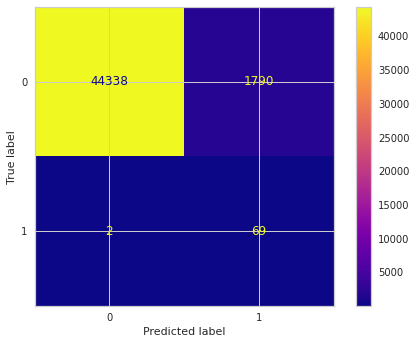

In [72]:
print("LogReg_tuned")
print ("------------------")
eval(LogReg_tuned, X_train, X_test)

In [73]:
cprint('Logistic Regression_tuned Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

Logistic Regression_tuned Scores


,train_set,test_set
Accuracy,0.962,0.961
Precision,0.037,0.037
Recall,0.940,0.972
f1,0.071,0.072
roc_auc,0.951,0.967
recall_auc,0.504,0.504


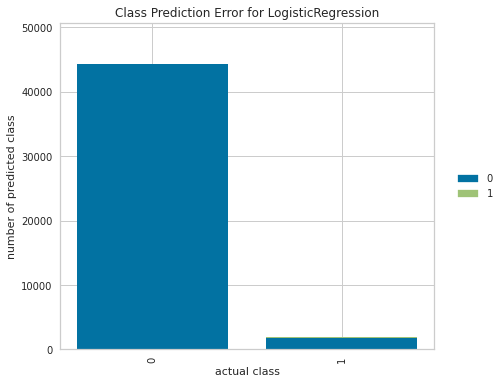

In [74]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(LogReg_tuned)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="5.2.5"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.5 Logistic Regression ROC (Receiver Operating Curve) and AUC (Area Under Curve)</p>

roc_curve


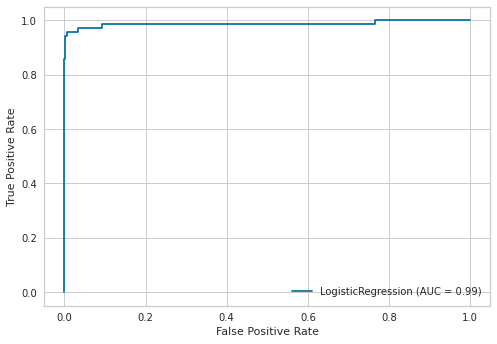

In [75]:
cprint('roc_curve','green', 'on_red')
plot_roc_curve(LogReg_tuned, X_test, y_test);

precision_recall_curve


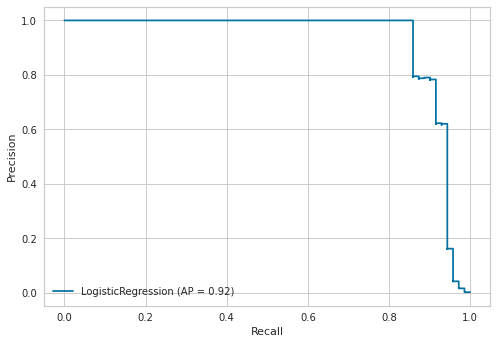

In [76]:
cprint('precision_recall_curve','green', 'on_red')
plot_precision_recall_curve(LogReg_tuned, X_test, y_test);

<a id="5.2.6"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.2.6 Prediction</p>

In [77]:
cprint('LogReg_tuned Predictions','green', 'on_red')
LogReg_Pred = {"Actual": y_test, "LogReg_Pred":y_pred}
LogReg_Pred = pd.DataFrame.from_dict(LogReg_Pred)
LogReg_Pred.sample(5)

LogReg_tuned Predictions


,Actual,LogReg_Pred
259410,0,0
81733,0,0
67167,0,0
78797,0,0
240514,0,0


In [78]:
pd.crosstab(LogReg_Pred['Actual'], LogReg_Pred['LogReg_Pred'])

LogReg_Pred,0,1
Actual,,
0,44338,1790
1,2,69


In [79]:
cprint('Predictions','green', 'on_red')
Model_Preds = LogReg_Pred
Model_Preds.sample(5)

Predictions


,Actual,LogReg_Pred
86796,0,0
175138,0,0
172566,0,0
26540,0,0
242372,0,1


In [80]:
# logistic_regression = pickle.dump(LogReg_tuned, open('logistic_Regression_Model(tuned)', 'wb'))

<a id="5.3"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">5.3 Random Forest Classifier without SMOTE<p>

<a id="5.3.1"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.1 Model Building with Random Forest Classifier<p>

In [81]:
RF_model = RandomForestClassifier(class_weight = "balanced", random_state = 42)
RF_model.fit(X_train, y_train)
y_pred = RF_model.predict(X_test)
y_train_pred = RF_model.predict(X_train)

<a id="5.3.2"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.2 Evaluating Model Performance</p>

In [82]:
RF_model_f1 = f1_score(y_test, y_pred)
RF_model_acc = accuracy_score(y_test, y_pred)
RF_model_recall = recall_score(y_test, y_pred)
RF_model_auc = roc_auc_score(y_test, y_pred)
RF_model_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
RF_model_recall_auc = auc(recall, precision)

RF_Model
------------------
[[46128     0]
 [   10    61]]
Test_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     46128
           1       1.00      0.86      0.92        71

    accuracy                           1.00     46199
   macro avg       1.00      0.93      0.96     46199
weighted avg       1.00      1.00      1.00     46199

Train_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    184512
           1       1.00      1.00      1.00       283

    accuracy                           1.00    184795
   macro avg       1.00      1.00      1.00    184795
weighted avg       1.00      1.00      1.00    184795

------------------------------------------------------------


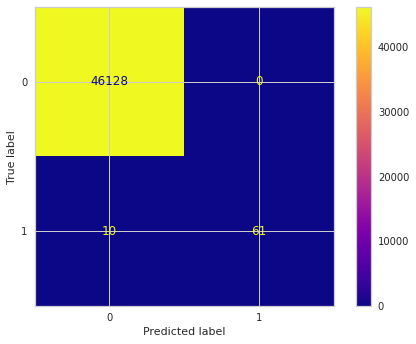

In [83]:
print("RF_Model")
print ("------------------")
eval(RF_model, X_train, X_test)

In [84]:
cprint('RF_model Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

RF_model Scores


,train_set,test_set
Accuracy,1.000,1.000
Precision,1.000,1.000
Recall,1.000,0.859
f1,1.000,0.924
roc_auc,1.000,0.930
recall_auc,0.930,0.930


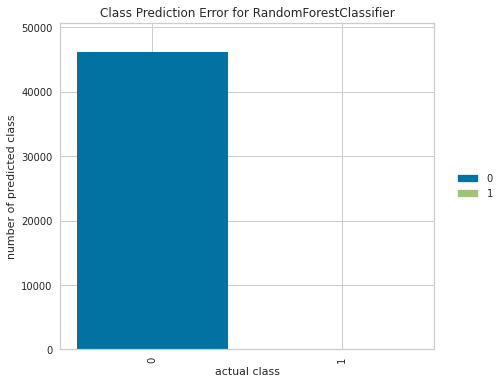

In [85]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(RF_model)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="5.3.3"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.3 Feature Importance for Random Forest Model</p>

In [86]:
cprint('Random Forest Feature Importance','green', 'on_red')
RF_feature_imp = pd.DataFrame(index=X.columns, data = RF_model.feature_importances_, columns = ['Importance']).sort_values("Importance", ascending = False)
RF_feature_imp

Random Forest Feature Importance


,Importance
v14,0.193
v4,0.109
v10,0.102
v12,0.099
v17,0.077
v2,0.055
v3,0.052
v11,0.049
v7,0.030
v16,0.028


In [87]:
fig = px.bar(RF_feature_imp.sort_values('Importance', ascending = False), x = RF_feature_imp.sort_values('Importance', 
             ascending = False).index, y = 'Importance', title = "Feature Importance", 
             labels = dict(x = "Features", y ="Feature_Importance"))
fig.show()

<a id="5.3.4"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.4 Random Forest Classifier Cross Validation</p>

In [88]:
cprint('Cross Validation scores for Random Forest with default parameters','green', 'on_red')
RF_cv = RandomForestClassifier(class_weight = "balanced", random_state = 42)
RF_cv_scores = cross_validate(RF_cv, X_train, y_train, 
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
RF_cv_scores = pd.DataFrame(RF_cv_scores, index = range(1, 11))
RF_cv_scores.mean()[2:]

Cross Validation scores for Random Forest with default parameters
[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=  18.9s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.1s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=  15.7s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=  15.9s
[CV] class_weight=None, penalty=l1, solver=saga ......................
[CV] ....... class_weight=None, penalty=l1, solver=saga, total=  18.6s
[CV] class_weight=None, penalty=l2, solver=saga ......................
[CV] ....... class_weight=None, penalty=l2, solver=saga, total=  15.6s
[CV] class_weight=None, penalty=l2, solver=lbfgs .....................
[CV] ......

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' pena

[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=  18.8s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.1s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.1s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=  15.7s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=  15.7s
[CV] class_weight=None, penalty=l1, solver=saga ......................
[CV] ....... class_weight=None, penalty=l1, solver=saga, total=  18.4s
[CV] c

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1417, in fit
    for class_, warm_start_coef_ in zip(classes_, warm_start_coef))

[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=  18.8s
[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=  18.4s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   2.3s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   2.3s
[CV] class_weight=None, penalty=l1, solver=saga ......................
[CV] ....... class_weight=None, penalty=l1, solver=saga, total=  19.1s
[CV] class_weight=None, penalty=l1, solver=lbfgs .....................
[CV] ...... class_weight=None, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=None, penalty=l1, solver=lbfgs .....................
[CV] ...... class_weight=None, penalty=l1, solver=lbfgs, total=   0.0s
[CV] c

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' pena

[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=  19.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.1s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=  15.8s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   2.3s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   2.4s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   2.3s
[CV] class_weight=None, penalty=l1, solver=saga ......................
[CV] ....... class_weight=None, penalty=l1, solver=saga, total=  18.8s
[CV] c

test_accuracy    1.000
test_precision   1.000
test_recall      0.774
test_f1          0.871
test_roc_auc     0.951
dtype: float64

<a id="5.3.5"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.5 Random Forest Classifier GridSearchCV</p>

In [89]:
param_grid = {'n_estimators' : [50, 100, 300],
              'max_features' : [2, 3, 4],
              'max_depth' : [3, 5, 7],
              'min_samples_split' : [2, 5, 8]}

In [90]:
RF_grid = RandomForestClassifier(class_weight = 'balanced', random_state = 42)
RF_grid_model = GridSearchCV(estimator = RF_grid, 
                             param_grid = param_grid, 
                             scoring = "recall", 
                             n_jobs = -1, verbose = 2)
RF_grid_model.fit(X_train, y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 25.7min


[CV] max_depth=3, max_features=2, min_samples_split=2, n_estimators=50 
[CV]  max_depth=3, max_features=2, min_samples_split=2, n_estimators=50, total=  10.1s
[CV] max_depth=3, max_features=2, min_samples_split=2, n_estimators=100 
[CV]  max_depth=3, max_features=2, min_samples_split=2, n_estimators=100, total=  19.4s
[CV] max_depth=3, max_features=2, min_samples_split=2, n_estimators=100 
[CV]  max_depth=3, max_features=2, min_samples_split=2, n_estimators=100, total=  19.3s
[CV] max_depth=3, max_features=2, min_samples_split=2, n_estimators=300 
[CV]  max_depth=3, max_features=2, min_samples_split=2, n_estimators=300, total=  57.9s
[CV] max_depth=3, max_features=2, min_samples_split=5, n_estimators=50 
[CV]  max_depth=3, max_features=2, min_samples_split=5, n_estimators=50, total=   9.6s
[CV] max_depth=3, max_features=2, min_samples_split=5, n_estimators=100 
[CV]  max_depth=3, max_features=2, min_samples_split=5, n_estimators=100, total=  19.9s
[CV] max_depth=3, max_features=2, min_

[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 83.3min



[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=50, total=  21.2s
[CV] max_depth=5, max_features=3, min_samples_split=5, n_estimators=100 
[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=100, total=  40.7s
[CV] max_depth=5, max_features=3, min_samples_split=5, n_estimators=300 
[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=300, total= 2.1min
[CV] max_depth=5, max_features=3, min_samples_split=5, n_estimators=300 
[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=300, total= 2.1min
[CV] max_depth=5, max_features=3, min_samples_split=8, n_estimators=300 
[CV]  max_depth=5, max_features=3, min_samples_split=8, n_estimators=300, total= 2.1min
[CV] max_depth=5, max_features=4, min_samples_split=2, n_estimators=50 
[CV]  max_depth=5, max_features=4, min_samples_split=2, n_estimators=50, total=  26.2s
[CV] max_depth=5, max_features=4, min_samples_split=2, n_estimators=50 
[CV]  max_depth=5, max_features=4, mi

[Parallel(n_jobs=-1)]: Done 405 out of 405 | elapsed: 104.9min finished


GridSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7], 'max_features': [2, 3, 4],
                         'min_samples_split': [2, 5, 8],
                         'n_estimators': [50, 100, 300]},
             scoring='recall', verbose=2)

In [91]:
print(colored('\033[1mBest Estimators of GridSearchCV for Random Forest Model:\033[0m', 'blue'), colored(RF_grid_model.best_estimator_, 'red'))

Best Estimators of GridSearchCV for Random Forest Model: RandomForestClassifier(class_weight='balanced', max_depth=5, max_features=2,
                       min_samples_split=5, n_estimators=50, random_state=42)


In [92]:
print(colored('\033[1mBest Parameters of GridSearchCV for Random Forest Model:\033[0m', 'blue'), colored(RF_grid_model.best_params_, 'red'))

Best Parameters of GridSearchCV for Random Forest Model: {'max_depth': 5, 'max_features': 2, 'min_samples_split': 5, 'n_estimators': 50}


In [93]:
RF_tuned = RandomForestClassifier(class_weight = 'balanced',
                                  max_depth = 5,
                                  max_features = 2,
                                  min_samples_split = 5,
                                  n_estimators = 50,
                                  random_state = 42).fit(X_train, y_train)

In [94]:
y_pred = RF_tuned.predict(X_test)
y_train_pred = RF_tuned.predict(X_train)

RF_tuned_f1 = f1_score(y_test, y_pred)
RF_tuned_acc = accuracy_score(y_test, y_pred)
RF_tuned_recall = recall_score(y_test, y_pred)
RF_tuned_auc = roc_auc_score(y_test, y_pred)
RF_tuned_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
RF_tuned_recall_auc = auc(recall, precision)

RF_tuned
------------------
[[46078    50]
 [    5    66]]
Test_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     46128
           1       0.57      0.93      0.71        71

    accuracy                           1.00     46199
   macro avg       0.78      0.96      0.85     46199
weighted avg       1.00      1.00      1.00     46199

Train_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    184512
           1       0.60      0.88      0.71       283

    accuracy                           1.00    184795
   macro avg       0.80      0.94      0.85    184795
weighted avg       1.00      1.00      1.00    184795

------------------------------------------------------------


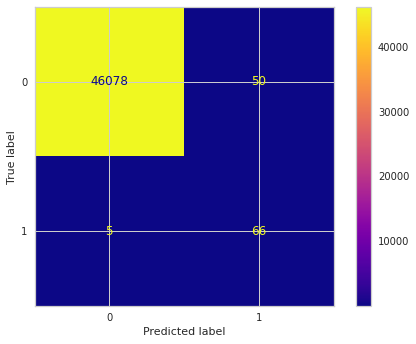

In [95]:
print("RF_tuned")
print ("------------------")
eval(RF_tuned, X_train, X_test)

In [96]:
cprint('RF_tuned Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

RF_tuned Scores


,train_set,test_set
Accuracy,0.999,0.999
Precision,0.596,0.569
Recall,0.876,0.930
f1,0.710,0.706
roc_auc,0.938,0.964
recall_auc,0.749,0.749


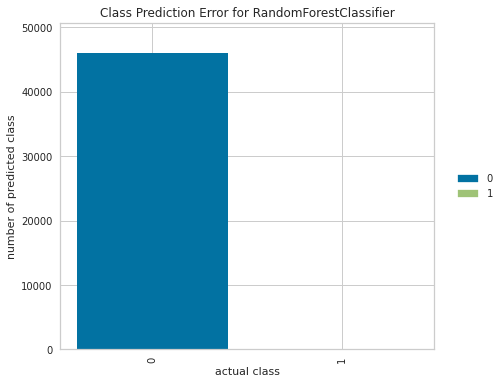

In [97]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(RF_tuned)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="5.3.6"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.6 Random Forest Classifier ROC (Receiver Operating Curve) and AUC (Area Under Curve)</p>

roc_curve


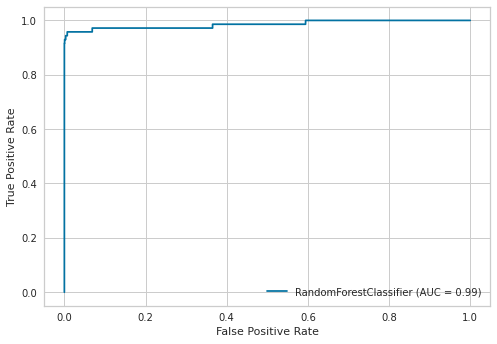

In [98]:
cprint('roc_curve','green', 'on_red')
plot_roc_curve(RF_tuned, X_test, y_test);

precision_recall_curve


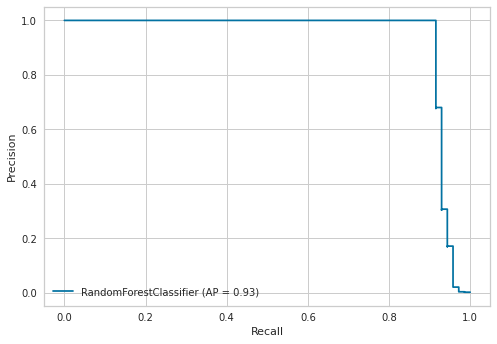

In [99]:
cprint('precision_recall_curve','green', 'on_red')
plot_precision_recall_curve(RF_tuned, X_test, y_test);

<a id="5.3.7"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">5.3.7 Prediction</p>

In [100]:
cprint('RF_tuned Predictions','green', 'on_red')
RF_Pred = {"Actual": y_test, "RF_Pred":y_pred}
RF_Pred = pd.DataFrame.from_dict(RF_Pred)
RF_Pred.sample(5)

RF_tuned Predictions


,Actual,RF_Pred
71615,0,0
191167,0,0
137192,0,0
166917,0,0
275347,0,0


In [101]:
pd.crosstab(RF_Pred['Actual'], RF_Pred['RF_Pred'])

RF_Pred,0,1
Actual,,
0,46078,50
1,5,66


In [102]:
cprint('Predictions','green', 'on_red')
RF_Pred.drop("Actual", axis = 1, inplace = True)
Model_Preds = pd.merge(Model_Preds, RF_Pred, left_index = True, right_index = True)
Model_Preds.sample(5)

Predictions


,Actual,LogReg_Pred,RF_Pred
241069,0,0,0
167351,0,0,0
183512,0,0,0
37217,0,1,0
190910,0,0,0


<a id="6"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6 - MODEL BUILDING WITH SMOTE<p>

    
This dataset is severely **unbalanced** (most of the transactions are non-fraud). So the algorithms are much more likely to classify new observations to the majority class and high accuracy won't tell us anything. To address the problem of imbalanced dataset we can use undersampling and oversampling data approach techniques. Oversampling increases the number of minority class members in the training set. The advantage of oversampling is that no information from the original training set is lost unlike in undersampling, as all observations from the minority and majority classes are kept. On the other hand, it is prone to overfitting. 

There is a type of oversampling called **[SMOTE](https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/)** (Synthetic Minority Oversampling Technique), which we are going to use to make our dataset balanced. It creates synthetic points from the minority class.

<a id="6.1"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6.1 Data Pre - Processing<p>

<a id="6.1.1"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.1.1 Scaling<p>

In [103]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [104]:
df_smote = df_out.copy()

In [105]:
scaler = StandardScaler()

df_smote["amount"] = scaler.fit_transform(df_ml["amount"].values.reshape(-1,1))
df_smote["time"] = scaler.fit_transform(df_ml["time"].values.reshape(-1,1))

<a id="6.1.2"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.1.2 Applying SMOTE and Train - Test Split<p>

In [106]:
X = df_smote.drop(['class'], axis = 1)
y = df_smote['class']

In [107]:
over = SMOTE(sampling_strategy = {1: 10000})
under = RandomUnderSampler(sampling_strategy = {0: 10000})
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps = steps)
X, y = pipeline.fit_resample(X, y)

In [108]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)

In [109]:
print('X_train.shape : ', X_train.shape)
print('X_test.shape  : ', X_test.shape)

X_train.shape :  (16000, 30)
X_test.shape  :  (4000, 30)


In [110]:
cprint('y_train.value_counts','green', 'on_red')
y_train.value_counts()

y_train.value_counts


1    8000
0    8000
Name: class, dtype: int64

In [111]:
cprint('y_test.value_counts','green', 'on_red')
y_test.value_counts()

y_test.value_counts


1    2000
0    2000
Name: class, dtype: int64

<a id="6.2"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6.2 Logistic Regression with SMOTE<p>

<a id="6.2.1"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.1 Model Building with Logistic Regression</p>

In [112]:
LogReg_smote_model = LogisticRegression(solver = 'liblinear', class_weight = 'balanced', random_state = 42)
LogReg_smote_model.fit(X_train, y_train)
y_pred = LogReg_smote_model.predict(X_test)
y_train_pred = LogReg_smote_model.predict(X_train)

<a id="6.2.2"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.2 Evaluating Model Performance</p>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#79FAF4" data-toggle="popover">Table of Contents</a>

In [113]:
LogReg_smote_model_f1 = f1_score(y_test, y_pred)
LogReg_smote_model_acc = accuracy_score(y_test, y_pred)
LogReg_smote_model_recall = recall_score(y_test, y_pred)
LogReg_smote_model_auc = roc_auc_score(y_test, y_pred)
LogReg_smote_model_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
LogReg_smote_model_recall_auc = auc(recall, precision)

LogRegSmote_Model
------------------
[[1965   35]
 [ 132 1868]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2000
           1       0.98      0.93      0.96      2000

    accuracy                           0.96      4000
   macro avg       0.96      0.96      0.96      4000
weighted avg       0.96      0.96      0.96      4000

Train_Set
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8000
           1       0.97      0.93      0.95      8000

    accuracy                           0.95     16000
   macro avg       0.95      0.95      0.95     16000
weighted avg       0.95      0.95      0.95     16000

------------------------------------------------------------


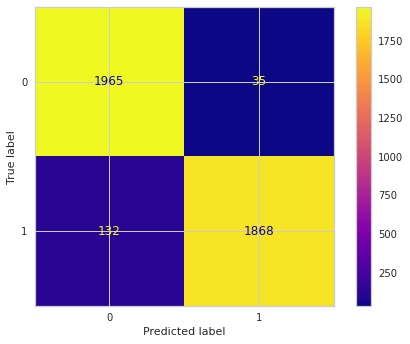

In [114]:
print("LogRegSmote_Model")
print ("------------------")
eval(LogReg_smote_model, X_train, X_test)

In [115]:
cprint('LogRegSmote_model Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

LogRegSmote_model Scores


,train_set,test_set
Accuracy,0.951,0.958
Precision,0.974,0.982
Recall,0.928,0.934
f1,0.950,0.957
roc_auc,0.951,0.958
recall_auc,0.974,0.974


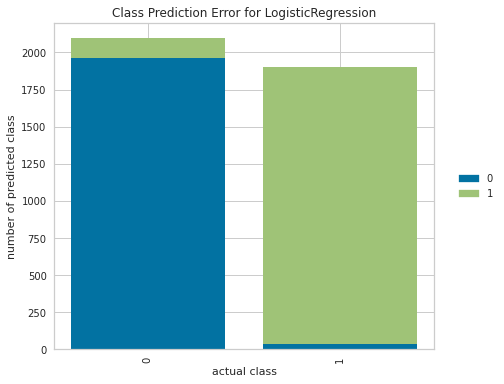

In [116]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(LogReg_smote_model)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="6.2.3"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.3 Logistic Regression Cross Validation</p>

In [117]:
cprint('Cross Validation scores for Logistic Regression with default parameters(SMOTE)','green', 'on_red')
LogRegSmote_cv = LogisticRegression(solver = 'liblinear', class_weight = 'balanced', random_state = 42)
LogRegSmote_cv_scores = cross_validate(LogRegSmote_cv, X_train, y_train, 
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
LogRegSmote_cv_scores = pd.DataFrame(LogRegSmote_cv_scores, index = range(1, 11))
LogRegSmote_cv_scores.mean()[2:]

Cross Validation scores for Logistic Regression with default parameters(SMOTE)


test_accuracy    0.951
test_precision   0.973
test_recall      0.928
test_f1          0.950
test_roc_auc     0.992
dtype: float64

<a id="6.2.4"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.4 Logistic Regression GridSearchCV</p>

In [118]:
param_grid = { "class_weight" : ["balanced", None],
              'penalty': ["l1","l2"],
              'solver' : ['saga','lbfgs'],
              }

In [119]:
LogRegSmote_grid = LogisticRegression(class_weight = 'balanced', random_state = 42)
LogRegSmote_grid_model = GridSearchCV(LogRegSmote_grid, param_grid, scoring = "f1", verbose = 2, n_jobs = -1).fit(X_train, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.



[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=100, total=  42.0s
[CV] max_depth=5, max_features=3, min_samples_split=5, n_estimators=100 
[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=100, total=  41.6s
[CV] max_depth=5, max_features=3, min_samples_split=5, n_estimators=300 
[CV]  max_depth=5, max_features=3, min_samples_split=5, n_estimators=300, total= 2.1min
[CV] max_depth=5, max_features=3, min_samples_split=8, n_estimators=50 
[CV]  max_depth=5, max_features=3, min_samples_split=8, n_estimators=50, total=  21.6s
[CV] max_depth=5, max_features=3, min_samples_split=8, n_estimators=50 
[CV]  max_depth=5, max_features=3, min_samples_split=8, n_estimators=50, total=  20.5s
[CV] max_depth=5, max_features=3, min_samples_split=8, n_estimators=100 
[CV]  max_depth=5, max_features=3, min_samples_split=8, n_estimators=100, total=  41.5s
[CV] max_depth=5, max_features=3, min_samples_split=8, n_estimators=300 
[CV]  max_depth=5, max_features=3, mi

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' pena

In [120]:
print(colored('\033[1mBest Estimators of GridSearchCV for Logistic Regression Model:\033[0m', 'blue'), colored(LogRegSmote_grid_model.best_estimator_, 'red'))

Best Estimators of GridSearchCV for Logistic Regression Model: LogisticRegression(class_weight='balanced', random_state=42, solver='saga')


In [121]:
print(colored('\033[1mBest Parameters of GridSearchCV for Logistic Regression Model:\033[0m', 'blue'), colored(LogRegSmote_grid_model.best_params_, 'red'))

Best Parameters of GridSearchCV for Logistic Regression Model: {'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'saga'}


In [122]:
# LogRegSmote_tuned = LogisticRegression(class_weight = 'balanced',
#                                        penalty = 'l2', 
#                                        solver = 'lbfgs',
#                                        random_state = 42).fit(X_train, y_train)

In [123]:
LogRegSmote_tuned = LogisticRegression(class_weight = 'balanced',
                                       solver = 'liblinear',
                                       random_state = 42).fit(X_train, y_train)

In [124]:
y_pred = LogRegSmote_tuned.predict(X_test)
y_train_pred = LogRegSmote_tuned.predict(X_train)

LogRegSmote_tuned_f1 = f1_score(y_test, y_pred)
LogRegSmote_tuned_acc = accuracy_score(y_test, y_pred)
LogRegSmote_tuned_recall = recall_score(y_test, y_pred)
LogRegSmote_tuned_auc = roc_auc_score(y_test, y_pred)
LogRegSmote_tuned_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
LogRegSmote_tuned_recall_auc = auc(recall, precision)

LogRegSmote_tuned
------------------
[[1965   35]
 [ 132 1868]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      2000
           1       0.98      0.93      0.96      2000

    accuracy                           0.96      4000
   macro avg       0.96      0.96      0.96      4000
weighted avg       0.96      0.96      0.96      4000

Train_Set
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      8000
           1       0.97      0.93      0.95      8000

    accuracy                           0.95     16000
   macro avg       0.95      0.95      0.95     16000
weighted avg       0.95      0.95      0.95     16000

------------------------------------------------------------


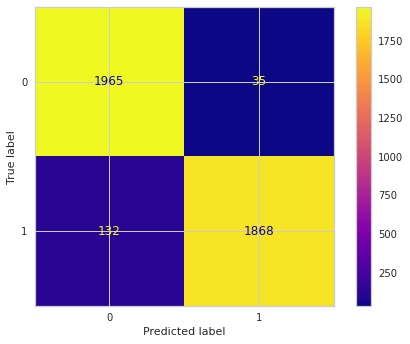

In [125]:
print("LogRegSmote_tuned")
print ("------------------")
eval(LogRegSmote_tuned, X_train, X_test)

In [126]:
cprint('LogRegSmote_tuned Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

LogRegSmote_tuned Scores


,train_set,test_set
Accuracy,0.951,0.958
Precision,0.974,0.982
Recall,0.928,0.934
f1,0.950,0.957
roc_auc,0.951,0.958
recall_auc,0.974,0.974


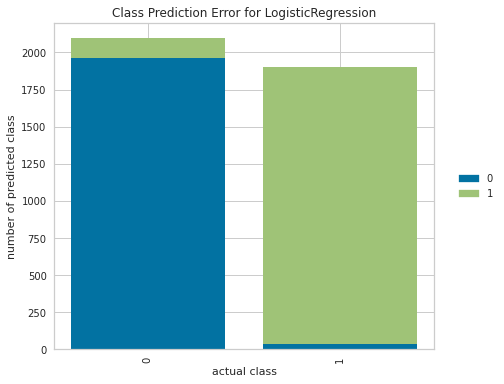

In [127]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(LogRegSmote_tuned)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="6.2.5"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.5 Logistic Regression ROC (Receiver Operating Curve) and AUC (Area Under Curve)</p>

roc_curve


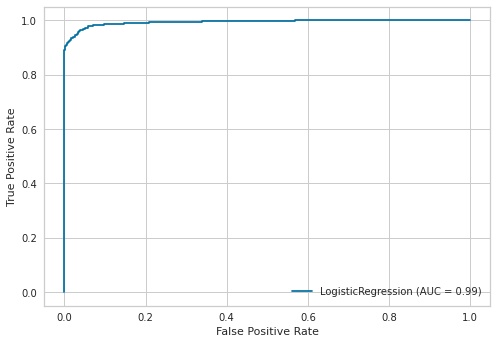

In [128]:
cprint('roc_curve','green', 'on_red')
plot_roc_curve(LogRegSmote_tuned, X_test, y_test);

precision_recall_curve


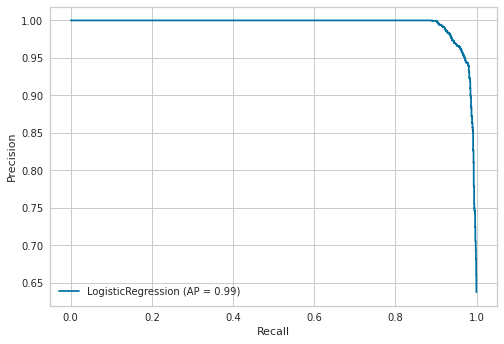

In [129]:
cprint('precision_recall_curve','green', 'on_red')
plot_precision_recall_curve(LogRegSmote_tuned, X_test, y_test);

<a id="6.2.6"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">6.2.6 Prediction</p>

In [130]:
cprint('LogRegSmote_tuned Predictions','green', 'on_red')
LogRegSmote_Pred = {"Actual": y_test, "LogRegSmote_Pred":y_pred}
LogRegSmote_Pred = pd.DataFrame.from_dict(LogRegSmote_Pred)
LogRegSmote_Pred.sample(5)

LogRegSmote_tuned Predictions


,Actual,LogRegSmote_Pred
18635,1,0
14394,1,1
6971,0,0
1591,0,0
2665,0,0


In [131]:
pd.crosstab(LogRegSmote_Pred['Actual'], LogRegSmote_Pred['LogRegSmote_Pred'])

LogRegSmote_Pred,0,1
Actual,,
0,1965,35
1,132,1868


In [132]:
cprint('Predictions','green', 'on_red')
LogRegSmote_Pred.drop("Actual", axis = 1, inplace = True)
Model_Preds = pd.merge(Model_Preds, LogRegSmote_Pred, left_index = True, right_index = True)
Model_Preds.sample(5)

Predictions


,Actual,LogReg_Pred,RF_Pred,LogRegSmote_Pred
10114,0,0,0,1
19834,0,0,0,1
5301,0,0,0,0
7996,0,0,0,0
19073,0,1,0,1


In [133]:
# logistic_regression_smote = pickle.dump(LogRegSmote_tuned, open('logistic_regression_smote(tuned)', 'wb'))

<a id="6.3"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">6.3 Random Forest Classifier with SMOTE<p>

<a id="6.3.1"></a>
#### <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Model Building with Random Forest Classifier<p>

In [134]:
RF_smote_model = RandomForestClassifier(class_weight = "balanced", random_state = 42)
RF_smote_model.fit(X_train, y_train)
y_pred = RF_smote_model.predict(X_test)
y_train_pred = RF_smote_model.predict(X_train)

<a id="6.3.2"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Evaluating Model Performance</p>

In [135]:
RF_smote_model_f1 = f1_score(y_test, y_pred)
RF_smote_model_acc = accuracy_score(y_test, y_pred)
RF_smote_model_recall = recall_score(y_test, y_pred)
RF_smote_model_auc = roc_auc_score(y_test, y_pred)
RF_smote_model_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
RF_smote_model_recall_auc = auc(recall, precision)

RF_smote_model
------------------
[[1999    1]
 [  10 1990]]
Test_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2000
           1       1.00      0.99      1.00      2000

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000

Train_Set
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8000
           1       1.00      1.00      1.00      8000

    accuracy                           1.00     16000
   macro avg       1.00      1.00      1.00     16000
weighted avg       1.00      1.00      1.00     16000

------------------------------------------------------------


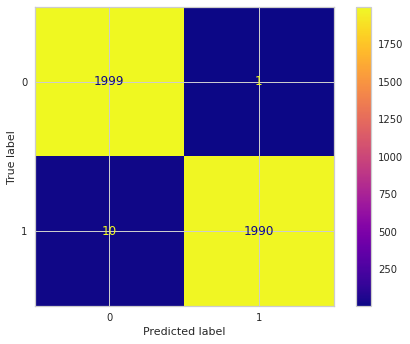

In [136]:
print("RF_smote_model")
print ("------------------")
eval(RF_smote_model, X_train, X_test)

In [137]:
cprint('RF_smote_model Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

RF_smote_model Scores


,train_set,test_set
Accuracy,1.000,0.997
Precision,1.000,0.999
Recall,1.000,0.995
f1,1.000,0.997
roc_auc,1.000,0.997
recall_auc,0.998,0.998


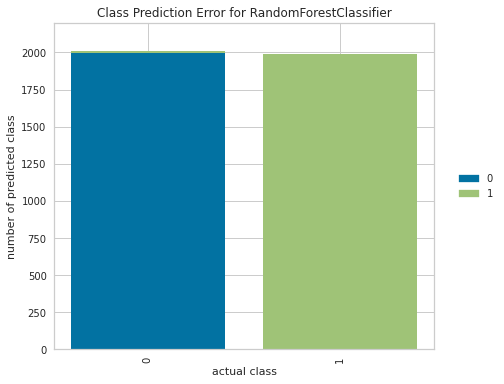

In [138]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(RF_smote_model)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="6.3.3"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Random Forest Classifier Cross Validation</p>

In [139]:
cprint('Cross Validation scores for Random Forest with default parameters(SMOTE)','green', 'on_red')
RF_smote_cv = RandomForestClassifier(class_weight = "balanced", random_state = 42)
RF_smote_cv_scores = cross_validate(RF_smote_cv, X_train, y_train, 
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
RF_smote_cv_scores = pd.DataFrame(RF_smote_cv_scores, index = range(1, 11))
RF_smote_cv_scores.mean()[2:]

Cross Validation scores for Random Forest with default parameters(SMOTE)


test_accuracy    0.995
test_precision   0.998
test_recall      0.993
test_f1          0.995
test_roc_auc     1.000
dtype: float64

<a id="6.3.4"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Random Forest Classifier GridSearchCV</p>

In [140]:
param_grid = {'n_estimators' : [50, 100, 300],
              'max_features' : [2, 3, 4],
              'max_depth' : [3, 5, 7],
              'min_samples_split' : [2, 5, 8]}

In [141]:
RF_smote_grid = RandomForestClassifier(class_weight = 'balanced', random_state = 42)
RF_smote_grid_model = GridSearchCV(estimator = RF_grid, 
                             param_grid = param_grid, 
                             scoring = "recall", 
                             n_jobs = -1, verbose = 2)
RF_smote_grid_model.fit(X_train, y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   16.9s



[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l1, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l1, solver=lbfgs, total=   0.0s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=   1.0s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=   1.0s
[CV] 

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.9min



[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=300, total= 3.5min
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=300, total= 2.6min
[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=   1.3s
[CV] class_weight=balanced, penalty=l1, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l1, solver=saga, total=   1.3s
[CV] class_weight=balanced, penalty=l2, solver=saga ..................
[CV] ... class_weight=balanced, penalty=l2, solver=saga, total=   1.0s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty=l2, solver=lbfgs, total=   0.2s
[CV] class_weight=balanced, penalty=l2, solver=lbfgs .................
[CV] .. class_weight=balanced, penalty

[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  5.6min


[CV] max_depth=5, max_features=2, min_samples_split=8, n_estimators=100 
[CV]  max_depth=5, max_features=2, min_samples_split=8, n_estimators=100, total=   2.7s
[CV] max_depth=5, max_features=2, min_samples_split=8, n_estimators=300 
[CV]  max_depth=5, max_features=2, min_samples_split=8, n_estimators=300, total=   6.1s
[CV] max_depth=5, max_features=3, min_samples_split=2, n_estimators=50 
[CV]  max_depth=5, max_features=3, min_samples_split=2, n_estimators=50, total=   1.3s
[CV] max_depth=5, max_features=3, min_samples_split=2, n_estimators=100 
[CV]  max_depth=5, max_features=3, min_samples_split=2, n_estimators=100, total=   2.7s
[CV] max_depth=5, max_features=3, min_samples_split=2, n_estimators=100 
[CV]  max_depth=5, max_features=3, min_samples_split=2, n_estimators=100, total=   2.7s
[CV] max_depth=5, max_features=3, min_samples_split=2, n_estimators=300 
[CV]  max_depth=5, max_features=3, min_samples_split=2, n_estimators=300, total=   7.9s
[CV] max_depth=5, max_features=3, mi

[Parallel(n_jobs=-1)]: Done 405 out of 405 | elapsed:  6.8min finished


GridSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7], 'max_features': [2, 3, 4],
                         'min_samples_split': [2, 5, 8],
                         'n_estimators': [50, 100, 300]},
             scoring='recall', verbose=2)

In [142]:
print(colored('\033[1mBest Estimators of GridSearchCV for Random Forest Smote Model:\033[0m', 'blue'), colored(RF_smote_grid_model.best_estimator_, 'red'))

Best Estimators of GridSearchCV for Random Forest Smote Model: RandomForestClassifier(class_weight='balanced', max_depth=7, max_features=4,
                       min_samples_split=5, n_estimators=50, random_state=42)


In [143]:
print(colored('\033[1mBest Parameters of GridSearchCV for Random Forest Smote Model:\033[0m', 'blue'), colored(RF_smote_grid_model.best_params_, 'red'))

Best Parameters of GridSearchCV for Random Forest Smote Model: {'max_depth': 7, 'max_features': 4, 'min_samples_split': 5, 'n_estimators': 50}


In [144]:
RFSmote_tuned = RandomForestClassifier(class_weight = 'balanced',
                                       max_depth = 7,
                                       max_features = 4,
                                       min_samples_split = 5,
                                       n_estimators = 100,
                                       random_state = 42).fit(X_train, y_train)

In [145]:
y_pred = RFSmote_tuned.predict(X_test)
y_train_pred = RFSmote_tuned.predict(X_train)

RFSmote_tuned_f1 = f1_score(y_test, y_pred)
RFSmote_tuned_acc = accuracy_score(y_test, y_pred)
RFSmote_tuned_recall = recall_score(y_test, y_pred)
RFSmote_tuned_auc = roc_auc_score(y_test, y_pred)
RFSmote_tuned_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
RFSmote_tuned_recall_auc = auc(recall, precision)

RFSmote_tuned
------------------
[[1999    1]
 [ 126 1874]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      2000
           1       1.00      0.94      0.97      2000

    accuracy                           0.97      4000
   macro avg       0.97      0.97      0.97      4000
weighted avg       0.97      0.97      0.97      4000

Train_Set
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      8000
           1       1.00      0.94      0.97      8000

    accuracy                           0.97     16000
   macro avg       0.97      0.97      0.97     16000
weighted avg       0.97      0.97      0.97     16000

------------------------------------------------------------


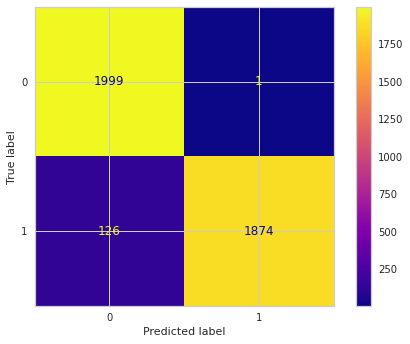

In [146]:
print("RFSmote_tuned")
print ("------------------")
eval(RFSmote_tuned, X_train, X_test)

In [147]:
cprint('RFSmote_tuned Scores','green', 'on_red')
train_val(y_train, y_train_pred, y_test, y_pred)

RFSmote_tuned Scores


,train_set,test_set
Accuracy,0.969,0.968
Precision,0.999,0.999
Recall,0.939,0.937
f1,0.968,0.967
roc_auc,0.969,0.968
recall_auc,0.984,0.984


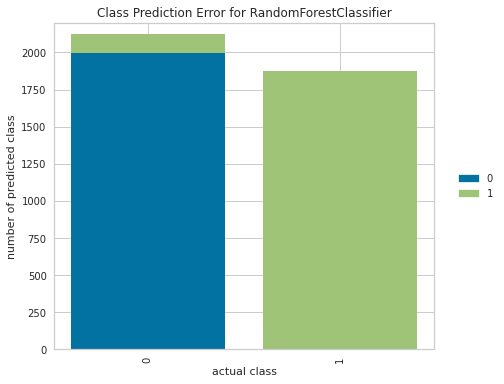

In [148]:
from yellowbrick.classifier import ClassPredictionError
visualizer = ClassPredictionError(RFSmote_tuned)
# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)
# Evaluate the model on the test data
visualizer.score(X_test, y_test)
# Draw visualization
visualizer.poof();

<a id="6.3.5"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Random Forest Classifier ROC (Receiver Operating Curve) and AUC (Area Under Curve)</p>

roc_curve


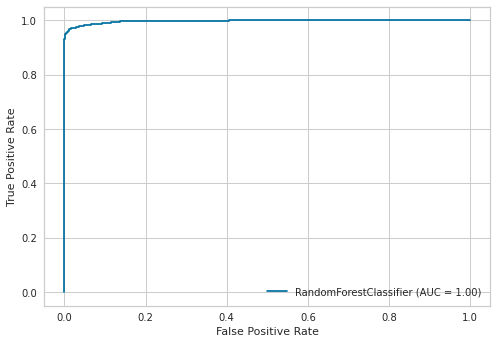

In [149]:
cprint('roc_curve','green', 'on_red')
plot_roc_curve(RFSmote_tuned, X_test, y_test);

precision_recall_curve


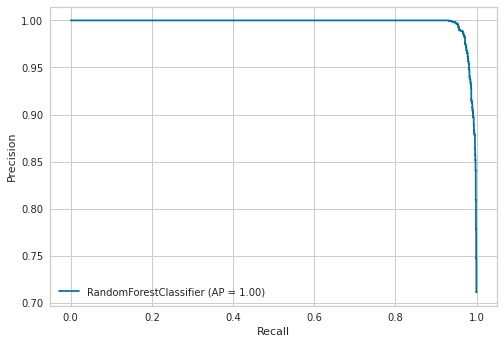

In [150]:
cprint('precision_recall_curve','green', 'on_red')
plot_precision_recall_curve(RFSmote_tuned, X_test, y_test);

<a id="6.3.6"></a>
#### <p style="background-color:#19D1D1; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:LEFT; border-radius:10px 10px;">Prediction</p>

In [151]:
cprint('RFSmote_tuned Predictions','green', 'on_red')
RFSmote_Pred = {"Actual": y_test, "RFSmote_Pred":y_pred}
RFSmote_Pred = pd.DataFrame.from_dict(RFSmote_Pred)
RFSmote_Pred.sample(5)

RFSmote_tuned Predictions


,Actual,RFSmote_Pred
16857,1,1
10330,1,1
4488,0,0
5029,0,0
11603,1,1


In [152]:
pd.crosstab(RFSmote_Pred['Actual'], RFSmote_Pred['RFSmote_Pred'])

RFSmote_Pred,0,1
Actual,,
0,1999,1
1,126,1874


In [153]:
cprint('Predictions','green', 'on_red')
RFSmote_Pred.drop("Actual", axis = 1, inplace = True)
Model_Preds = pd.merge(Model_Preds, RFSmote_Pred, left_index = True, right_index = True)
Model_Preds.sample(10)

Predictions


,Actual,LogReg_Pred,RF_Pred,LogRegSmote_Pred,RFSmote_Pred
5191,0,0,0,0,0
3953,0,0,0,0,0
11494,0,0,0,1,1
9236,0,0,0,0,0
1214,0,1,0,0,0
14562,0,0,0,1,1
5949,0,1,0,1,0
7494,0,0,0,0,0
3987,0,0,0,1,0
3572,0,0,0,0,0


<a id="7"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">NEURAL NETWORK<p>

In the final step, we will make classification with Neural Network which is a Deep Learning algorithm. 

Neural networks are a series of algorithms that mimic the operations of a human brain to recognize relationships between vast amounts of data. They are used in a variety of applications in financial services, from forecasting and marketing research to fraud detection and risk assessment.

A neural network contains layers of interconnected nodes. Each node is a perceptron and is similar to a multiple linear regression. The perceptron feeds the signal produced by a multiple linear regression into an activation function that may be nonlinear.

In a multi-layered perceptron (MLP), perceptrons are arranged in interconnected layers. The input layer collects input patterns. The output layer has classifications or output signals to which input patterns may map. 

Hidden layers fine-tune the input weightings until the neural network’s margin of error is minimal. It is hypothesized that hidden layers extrapolate salient features in the input data that have predictive power regarding the outputs.

We will discover **[how to create](https://towardsdatascience.com/building-our-first-neural-network-in-keras-bdc8abbc17f5)** your deep learning neural network model in Python using **[Keras](https://keras.io/about/)**. Keras is a powerful and easy-to-use free open source Python library for developing and evaluating deep learning models.

- The steps we are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Define Model*
    
   *iii. Compile Model*
   
   *iv. Fit Model*
   
   *v. Prediction and Model Evaluating*
   
   *vi. Plot Precision and Recall Curve*

<a id="7.1"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;"> Data Pre - Processing<p>

<a id="7.1.1"></a>
#### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">Scaling<p>

In [154]:
df_dl = df_out.copy()

In [155]:
scaler = StandardScaler()

df_dl["amount"] = scaler.fit_transform(df_dl["amount"].values.reshape(-1,1))
df_dl["time"] = scaler.fit_transform(df_dl["time"].values.reshape(-1,1))

<a id="7.1.2"></a>
#### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.1.2 Train - Test Split<p>

In [156]:
X = df_dl.drop(['class'], axis = 1)
y = df_dl['class']

In [157]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)

In [158]:
print('X_train.shape : ', X_train.shape)
print('X_test.shape  : ', X_test.shape)

X_train.shape :  (184795, 30)
X_test.shape  :  (46199, 30)


In [159]:
cprint('y_train.value_counts','green', 'on_red')
print("-----"*10)
y_train.value_counts()

y_train.value_counts
--------------------------------------------------


0    184512
1       283
Name: class, dtype: int64

In [160]:
cprint('y_test.value_counts','green', 'on_red')
print("-----"*10)
y_test.value_counts()

y_test.value_counts
--------------------------------------------------


0    46128
1       71
Name: class, dtype: int64

<a id="7.2"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.2 Import Libraries<p>

In [161]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD, Adamax, RMSprop,Adadelta
from tensorflow.keras.layers import Dropout
from sklearn.utils import class_weight
from sklearn.utils import compute_class_weight
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve, average_precision_score
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

<a id="7.3"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.3 Define Model<p>

In [162]:
dl_model = Sequential()

dl_model.add(Dense(32, activation = "relu"))
dl_model.add(Dropout(0.25))
dl_model.add(Dense(16, activation = "relu"))
dl_model.add(Dropout(0.25))
dl_model.add(Dense(1, activation = "sigmoid"))


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
   KMP_PLAIN_BARRIER_P

<a id="7.4"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.4 Compile Model<p>

In [163]:
optimizer = Adam(lr = 0.001)
dl_model.compile(loss = 'binary_crossentropy',
                 optimizer = optimizer,
                 metrics = ["Recall"])

In [164]:
train_classes = y_train
class_weights = compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(train_classes),
                                        y = train_classes                                                    
                                    )
class_weights = dict(zip(np.unique(train_classes), class_weights)),
print("class_weights : ", class_weights)

class_weights :  ({0: 0.500766887790496, 1: 326.4929328621908},)


In [165]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 20, restore_best_weights = True)

<a id="7.5"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.5 Fit Model<p>

In [166]:
dl_model.fit(x = X_train, y = y_train, 
             validation_split = 0.1, 
             batch_size = 64, 
             epochs = 500, 
             verbose = 0, 
             callbacks = [early_stop], 
             class_weight = {0: 0.500766887790496, 1: 326.4929328621908})


[CV] max_depth=7, max_features=3, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=3, min_samples_split=8, n_estimators=300, total=  10.3s
[CV] max_depth=7, max_features=4, min_samples_split=2, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=2, n_estimators=50, total=   2.0s
[CV] max_depth=7, max_features=4, min_samples_split=2, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=2, n_estimators=100, total=   4.1s
[CV] max_depth=7, max_features=4, min_samples_split=2, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=2, n_estimators=100, total=   4.2s
[CV] max_depth=7, max_features=4, min_samples_split=2, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=2, n_estimators=300, total=  12.4s
[CV] max_depth=7, max_features=4, min_samples_split=5, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=50, total=   2.4s
[CV] max_depth=7, max_features=4, min

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)



[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=100, total=   4.1s
[CV] max_depth=7, max_features=4, min_samples_split=5, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=300, total=  12.5s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=50, total=   2.1s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=100, total=   4.1s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=100, total=   4.1s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=300, total=  11.8s


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition fo


[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=50, total=   2.3s
[CV] max_depth=7, max_features=4, min_samples_split=5, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=100, total=   4.3s
[CV] max_depth=7, max_features=4, min_samples_split=5, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=100, total=   4.1s
[CV] max_depth=7, max_features=4, min_samples_split=5, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=300, total=  12.2s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=50, total=   2.5s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=50, total=   2.2s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=100 
[CV]  max_depth=7, max_features=4, min

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition fo


[CV]  max_depth=7, max_features=4, min_samples_split=5, n_estimators=300, total=  12.2s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=50, total=   2.8s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=50 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=50, total=   2.2s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=100 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=100, total=   4.0s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=300, total=  12.2s
[CV] max_depth=7, max_features=4, min_samples_split=8, n_estimators=300 
[CV]  max_depth=7, max_features=4, min_samples_split=8, n_estimators=300, total=   9.3s
Restoring model weights from the end of the best epoch.
Epoch 00056: early stopping


In [167]:
dl_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                992       
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 17        
Total params: 1,537
Trainable params: 1,537
Non-trainable params: 0
_________________________________________________________________


<a id="7.6"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.6 Evaluating Model Performance<p>
<!-- <a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Table of Contents</a> -->

In [168]:
cprint('DL_model loss_df','green', 'on_red')
loss_df = pd.DataFrame(dl_model.history.history)
loss_df.head(1)

DL_model loss_df


,loss,recall,val_loss,val_recall
0,0.341,0.774,0.116,0.935


DL_model loss_df


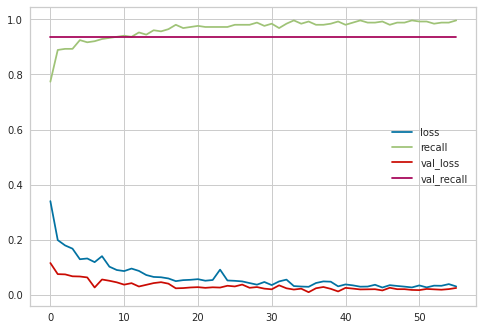

In [169]:
cprint('DL_model loss_df','green', 'on_red')
loss_df.plot();

In [170]:
cprint('DL_model Evaluation(train_set)','green', 'on_red')
print("-----"*10)
dl_model.evaluate(X_train, y_train)

DL_model Evaluation(train_set)
--------------------------------------------------
5775/5775 [==============================] - 7s 1ms/step - loss: 0.0073 - recall: 0.9717


[0.007258291821926832, 0.971731424331665]

In [171]:
cprint('DL_model Evaluation(test_set)','green', 'on_red')
print("-----"*10)
dl_model.evaluate(X_test, y_test)

DL_model Evaluation(test_set)
--------------------------------------------------
1444/1444 [==============================] - 2s 1ms/step - loss: 0.0088 - recall: 0.9296


[0.008849339559674263, 0.9295774698257446]

In [172]:
cprint('DL_model loss & accuracy','green', 'on_red')
print("-----"*10)
loss, accuracy = dl_model.evaluate(X_test, y_test, verbose=0)
print("loss     : ", loss)
print("accuracy : ", accuracy)

DL_model loss & accuracy
--------------------------------------------------
loss     :  0.008849339559674263
accuracy :  0.9295774698257446


In [173]:
cprint('Confusion_Matrix & Classification_Report','green', 'on_red')
print("-----"*10)
y_pred = (dl_model.predict(X_test) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Confusion_Matrix & Classification_Report
--------------------------------------------------
[[45998   130]
 [    5    66]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     46128
           1       0.34      0.93      0.49        71

    accuracy                           1.00     46199
   macro avg       0.67      0.96      0.75     46199
weighted avg       1.00      1.00      1.00     46199



In [174]:
y_pred_proba = dl_model.predict(X_test)

DL_Acc = accuracy_score(y_test, y_pred)
DL_AP = average_precision_score(y_test, y_pred_proba)
DL_f1 = f1_score(y_test, y_pred)
DL_rec = recall_score(y_test, y_pred)
DL_roc_auc = roc_auc_score(y_test, y_pred_proba)
DL_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
DL_recall_auc = auc(recall, precision)

In [175]:
cprint('DL_model Scores','green', 'on_red')
print("-----"*10)
print("DL_Acc           :", DL_Acc)
print("DL_AP            :", DL_AP)
print("DL_f1            :", DL_f1)
print("DL_rec           :", DL_rec)
print("DL_roc_auc       :", DL_roc_auc)
print("DL_pre           :", DL_pre)
print("DL_recall_auc    :", DL_recall_auc)

DL_model Scores
--------------------------------------------------
DL_Acc           : 0.9970778588281132
DL_AP            : 0.9216390386702352
DL_f1            : 0.49438202247191015
DL_rec           : 0.9295774647887324
DL_roc_auc       : 0.9880152838641282
DL_pre           : 0.336734693877551
DL_recall_auc    : 0.6332101930585471


<a id="7.7"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.7 Neural Network GridSearchCV<p>

In [176]:
def build_classifier(optimizer):
    classifier = Sequential()
    classifier.add(Dense(units = 32, activation = 'relu'))
    classifier.add(Dropout(0.25))
    classifier.add(Dense(units = 16, activation = 'relu'))
    classifier.add(Dropout(0.25))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ["Recall"])
    return classifier

In [177]:
print("class_weights : ", class_weights)

class_weights :  ({0: 0.500766887790496, 1: 326.4929328621908},)


In [178]:
early_stop = EarlyStopping(monitor = "loss", mode = "auto", verbose = 1, patience = 20, restore_best_weights=True)

In [179]:
classifier = KerasClassifier(build_fn = build_classifier, epochs = 20)
parameters = {'batch_size': [32, 64],
              'optimizer': ['adam', 'rmsprop', "SGD", "adagrad", "adadelta"]}
grid_model = GridSearchCV(estimator = classifier,
                          param_grid = parameters,
                          scoring = 'recall',
                          cv = 10,
                          n_jobs = -1,
                          verbose = 0)
grid_model.fit(X_train, y_train, callbacks = [early_stop], class_weight = {0: 0.500766887790496, 1: 326.4929328621908})


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

Epoch 1/20
  30/5198 [..............................] - ETA: 18s - loss: 0.7562 - recall: 0.0000e+00


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

5198/5198 [==============================] - 19s 3ms/step - loss: 0.3451 - recall: 0.8093
Epoch 2/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1699 - recall: 0.9027
Epoch 3/20
5198/5198 [==============================] - 18s 3ms/step - loss: 0.2084 - recall: 0.9015
Epoch 3/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1720 - recall: 0.9234
Epoch 4/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.2299 - recall: 0.9015
Epoch 4/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1475 - recall: 0.9153
Epoch 5/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1534 - recall: 0.9222
Epoch 5/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1369 - recall: 0.9124
Epoch 5/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.1414 - recall: 0.9205
Epoch 5/20
5198/5198 [==============================] - 18s 3ms/step - loss: 0.1270 - recall: 0.9084
E


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

5198/5198 [==============================] - 11s 2ms/step - loss: 0.3346 - recall: 0.8521
Epoch 20/20
  83/5198 [..............................] - ETA: 12s - loss: 0.4029 - recall: 0.7500


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

5198/5198 [==============================] - 13s 2ms/step - loss: 0.3599 - recall: 0.8387
Epoch 16/20
5198/5198 [==============================] - 17s 3ms/step - loss: 0.5387 - recall: 0.7121
Epoch 2/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.3497 - recall: 0.8226
Epoch 17/20
5198/5198 [==============================] - 13s 2ms/step - loss: 0.4454 - recall: 0.8030
Epoch 3/20
5198/5198 [==============================] - 12s 2ms/step - loss: 0.5560 - recall: 0.6892
Epoch 3/20
5198/5198 [==============================] - 12s 2ms/step - loss: 0.3791 - recall: 0.8145
Epoch 18/20
5198/5198 [==============================] - 12s 2ms/step - loss: 0.5352 - recall: 0.7251
Epoch 4/20
5198/5198 [==============================] - 13s 3ms/step - loss: 0.3589 - recall: 0.8185
Epoch 19/20
5198/5198 [==============================] - 14s 3ms/step - loss: 0.3781 - recall: 0.8523
Epoch 5/20
5198/5198 [==============================] - 13s 3ms/step - loss: 0.4743 - recall: 0.74


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

5198/5198 [==============================] - 15s 3ms/step - loss: 0.3817 - recall: 0.8182
Epoch 6/20
5198/5198 [==============================] - 16s 3ms/step - loss: 0.5037 - recall: 0.7450
Epoch 6/20
5198/5198 [==============================] - 16s 3ms/step - loss: 1.2033 - recall: 0.2789
Epoch 3/20
4775/5198 [==========================>...] - ETA: 1s - loss: 0.3757 - recall: 0.8320


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

5198/5198 [==============================] - 13s 3ms/step - loss: 0.4655 - recall: 0.7649
Epoch 8/20
5198/5198 [==============================] - 14s 3ms/step - loss: 0.8921 - recall: 0.3147
Epoch 4/20
5198/5198 [==============================] - 18s 3ms/step - loss: 0.7895 - recall: 0.6169
Epoch 2/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.3568 - recall: 0.8371
Epoch 9/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.4280 - recall: 0.8207
Epoch 9/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.5585 - recall: 0.6855
Epoch 3/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.3498 - recall: 0.8674
Epoch 11/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.3363 - recall: 0.8523
Epoch 12/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.4327 - recall: 0.7742
Epoch 6/20
5198/5198 [==============================] - 15s 3ms/step - loss: 0.3309 - recall: 0.8485


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2478/2599 [===========================>..] - ETA: 0s - loss: 1.0366 - recall: 0.8117


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 8s 2ms/step - loss: 1.3439 - recall: 0.6375
Epoch 2/20
2599/2599 [==============================] - 9s 3ms/step - loss: 1.1230 - recall: 0.6815
Epoch 2/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.0365 - recall: 0.7928
Epoch 16/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.4855 - recall: 0.7621
Epoch 3/20
2599/2599 [==============================] - 7s 3ms/step - loss: 0.9274 - recall: 0.8008
Epoch 17/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.7380 - recall: 0.7769
Epoch 4/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.3249 - recall: 0.7984
Epoch 4/20
2599/2599 [==============================] - 7s 3ms/step - loss: 0.9004 - recall: 0.7928
Epoch 18/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.2722 - recall: 0.7968
Epoch 5/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.3159 - recall: 0.7823
Epoch 5/


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 8s 3ms/step - loss: 1.0835 - recall: 0.7928
Epoch 8/20
2599/2599 [==============================] - 11s 3ms/step - loss: 1.1542 - recall: 0.6873
Epoch 2/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.0312 - recall: 0.7903
Epoch 8/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.9543 - recall: 0.7928
Epoch 9/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.3673 - recall: 0.7838
Epoch 3/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.9314 - recall: 0.8105
Epoch 9/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.1134 - recall: 0.8008
Epoch 10/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.3354 - recall: 0.7915
Epoch 4/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.9398 - recall: 0.7823
Epoch 10/20
2599/2599 [==============================] - 7s 3ms/step - loss: 0.7957 - recall: 0.8008
Epoch 11


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 8s 3ms/step - loss: 1.1195 - recall: 0.7915
Epoch 13/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.8991 - recall: 0.8105
Epoch 19/20
2599/2599 [==============================] - 8s 3ms/step - loss: 1.2813 - recall: 0.8048
Epoch 20/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.9480 - recall: 0.8105
Epoch 20/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.8740 - recall: 0.7992
Epoch 15/20
2599/2599 [==============================] - 8s 3ms/step - loss: 1.4607 - recall: 0.8046
Epoch 4/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.0041 - recall: 0.7954
Epoch 16/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.6817 - recall: 0.7816
Epoch 5/20
2599/2599 [==============================] - 9s 3ms/step - loss: 1.4303 - recall: 0.5625
Epoch 2/20
2599/2599 [==============================] - 7s 3ms/step - loss: 0.9047 - recall: 0.8069
Epoch


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 7s 3ms/step - loss: 0.6869 - recall: 0.8287
Epoch 7/20
2599/2599 [==============================] - 8s 3ms/step - loss: 1.3659 - recall: 0.4315
Epoch 3/20
2599/2599 [==============================] - 11s 3ms/step - loss: 1.3375 - recall: 0.2934
Epoch 2/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.6664 - recall: 0.8406
Epoch 8/20
2599/2599 [==============================] - 8s 3ms/step - loss: 1.4106 - recall: 0.4315
Epoch 4/20
2599/2599 [==============================] - 9s 3ms/step - loss: 0.6580 - recall: 0.8367
Epoch 9/20
2599/2599 [==============================] - 9s 3ms/step - loss: 1.3425 - recall: 0.2625
Epoch 3/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.6445 - recall: 0.8645
Epoch 10/20
2599/2599 [==============================] - 8s 3ms/step - loss: 0.6387 - recall: 0.7331
Epoch 12/20
2599/2599 [==============================] - 8s 3ms/step - loss: 1.3727 - recall: 0.4153
Epoch 6/


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 4s 1ms/step - loss: 1.1192 - recall: 0.4674
Epoch 5/20
2599/2599 [==============================] - 5s 2ms/step - loss: 1.0015 - recall: 0.4598
Epoch 6/20
2599/2599 [==============================] - 5s 2ms/step - loss: 0.7000 - recall: 0.7812
Epoch 3/20
2599/2599 [==============================] - 5s 2ms/step - loss: 1.0213 - recall: 0.4444
Epoch 7/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.9647 - recall: 0.4674
Epoch 8/20
   1/2599 [..............................] - ETA: 1:30:38 - loss: 0.4648 - recall: 0.0000e+00


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0
   OMP_NUM_THREADS=1

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
 

2599/2599 [==============================] - 6s 2ms/step - loss: 0.6686 - recall: 0.7930
Epoch 5/20
2599/2599 [==============================] - 5s 2ms/step - loss: 1.0435 - recall: 0.4406
Epoch 9/20
2599/2599 [==============================] - 7s 3ms/step - loss: 0.7208 - recall: 0.7500
Epoch 6/20
2599/2599 [==============================] - 7s 3ms/step - loss: 1.0890 - recall: 0.4368
Epoch 10/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.7986 - recall: 0.6548
Epoch 3/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.6958 - recall: 0.7539
Epoch 7/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.9540 - recall: 0.4943
Epoch 11/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.7138 - recall: 0.7381
Epoch 4/20
2599/2599 [==============================] - 6s 2ms/step - loss: 0.6850 - recall: 0.7500
Epoch 8/20
2599/2599 [==============================] - 6s 2ms/step - loss: 1.0174 - recall: 0.4521
Epoch 12/

GridSearchCV(cv=10,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7ee2c9f73650>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64],
                         'optimizer': ['adam', 'rmsprop', 'SGD', 'adagrad',
                                       'adadelta']},
             scoring='recall')

In [180]:
print("grid_model.best_score_ :", grid_model.best_score_)

grid_model.best_score_ : 0.9142150912503204


In [181]:
print("grid_model.best_params_ :", grid_model.best_params_)

grid_model.best_params_ : {'batch_size': 64, 'optimizer': 'SGD'}


In [182]:
y_test_pred = (grid_model.predict(X_test) > 0.5).astype("int32")
print(confusion_matrix(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred))

[[45258   870]
 [    3    68]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     46128
           1       0.07      0.96      0.13        71

    accuracy                           0.98     46199
   macro avg       0.54      0.97      0.56     46199
weighted avg       1.00      0.98      0.99     46199



In [183]:
dl_tuned = Sequential()

dl_tuned.add(Dense(32, activation = "relu"))
dl_tuned.add(Dropout(0.25))
dl_tuned.add(Dense(16, activation = "relu"))
dl_tuned.add(Dropout(0.25))
dl_tuned.add(Dense(1, activation = "sigmoid"))

In [184]:
optimizer = SGD(lr = 0.001)
dl_tuned.compile(loss = 'binary_crossentropy',
                 optimizer = optimizer,
                 metrics = ["Recall"])

In [185]:
train_classes = y_train
class_weights = compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(train_classes),
                                        y = train_classes                                                    
                                    )
class_weights = dict(zip(np.unique(train_classes), class_weights)),
class_weights

({0: 0.500766887790496, 1: 326.4929328621908},)

In [186]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 20, restore_best_weights = True)

In [187]:
dl_tuned.fit(x = X_train, y = y_train, 
             validation_split = 0.1, 
             batch_size = 64, 
             epochs = 500, 
             verbose = 0, 
             callbacks = [early_stop], 
             class_weight = {0: 0.500766887790496, 1: 326.4929328621908})

Restoring model weights from the end of the best epoch.
Epoch 00196: early stopping


In [188]:
dl_tuned.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                992       
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 17        
Total params: 1,537
Trainable params: 1,537
Non-trainable params: 0
_________________________________________________________________


In [189]:
cprint('DL_tuned loss_df','green', 'on_red')
loss_df = pd.DataFrame(dl_tuned.history.history)
loss_df.head(1)

DL_tuned loss_df


,loss,recall,val_loss,val_recall
0,0.452,0.758,0.336,0.935


DL_tuned loss_df


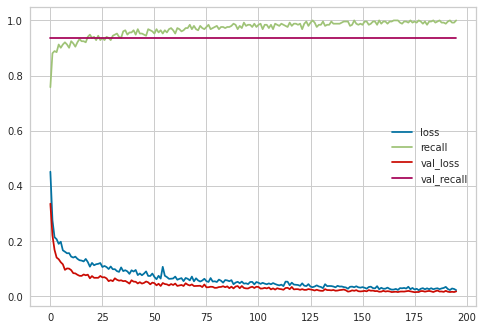

In [190]:
cprint('DL_tuned loss_df','green', 'on_red')
loss_df.plot();

In [191]:
cprint('DL_tuned Evaluation(train_set)','green', 'on_red')
print("-----"*10)
dl_tuned.evaluate(X_train, y_train)

DL_tuned Evaluation(train_set)
--------------------------------------------------
5775/5775 [==============================] - 6s 1ms/step - loss: 0.0138 - recall: 0.9929


[0.013800445944070816, 0.9929328560829163]

In [192]:
cprint('DL_tuned Evaluation(test_set)','green', 'on_red')
print("-----"*10)
dl_tuned.evaluate(X_test, y_test)

DL_tuned Evaluation(test_set)
--------------------------------------------------
1444/1444 [==============================] - 2s 1ms/step - loss: 0.0150 - recall: 0.9577


[0.015035194344818592, 0.9577465057373047]

In [193]:
cprint('DL_tuned loss & accuracy','green', 'on_red')
print("-----"*10)
loss, accuracy = dl_tuned.evaluate(X_test, y_test, verbose=0)
print("loss     : ", loss)
print("accuracy : ", accuracy)

DL_tuned loss & accuracy
--------------------------------------------------
loss     :  0.015035194344818592
accuracy :  0.9577465057373047


In [194]:
cprint('Confusion_Matrix & Classification_Report','green', 'on_red')
y_pred = (dl_tuned.predict(X_test) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Confusion_Matrix & Classification_Report
[[45872   256]
 [    3    68]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     46128
           1       0.21      0.96      0.34        71

    accuracy                           0.99     46199
   macro avg       0.60      0.98      0.67     46199
weighted avg       1.00      0.99      1.00     46199



In [195]:
y_pred_proba = dl_tuned.predict(X_test)

DLTuned_Acc = accuracy_score(y_test, y_pred)
DLTuned_AP = average_precision_score(y_test, y_pred_proba)
DLTuned_f1 = f1_score(y_test, y_pred)
DLTuned_rec = recall_score(y_test, y_pred)
DLTuned_roc_auc = roc_auc_score(y_test, y_pred_proba)
DLTuned_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
DLTuned_recall_auc = auc(recall, precision)

In [196]:
cprint('DL_model Scores','green', 'on_red')
print("-----"*10)
print("DL_Tuned_Acc           :", DLTuned_Acc)
print("DL_Tuned_AP            :", DLTuned_AP)
print("DL_Tuned_f1            :", DLTuned_f1)
print("DL_Tuned_rec           :", DLTuned_rec)
print("DL_Tuned_roc_auc       :", DLTuned_roc_auc)
print("DL_Tuned_pre           :", DLTuned_pre)
print("DL_Tuned_recall_auc    :", DLTuned_recall_auc)

DL_model Scores
--------------------------------------------------
DL_Tuned_Acc           : 0.9943938180480097
DL_Tuned_AP            : 0.9339852030193807
DL_Tuned_f1            : 0.34430379746835443
DL_Tuned_rec           : 0.9577464788732394
DL_Tuned_roc_auc       : 0.9927122568920286
DL_Tuned_pre           : 0.20987654320987653
DL_Tuned_recall_auc    : 0.5838439792768011


<a id="7.8"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.8 Neural Network ROC (Receiver Operating Curve) & AUC (Area Under Curve)<p>

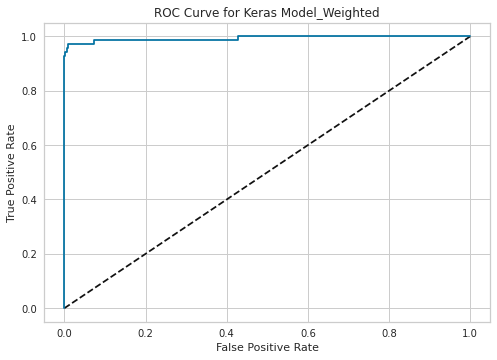

In [197]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Keras Model_Weighted')
plt.show()

In [198]:
cprint('optimal_threshold for roc_curve','green', 'on_red')
print("-----"*10)
fp_rate, tp_rate, thresholds = roc_curve(y_test, y_pred_proba)
optimal_idx = np.argmax(tp_rate - fp_rate)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

optimal_threshold for roc_curve
--------------------------------------------------


0.34753975

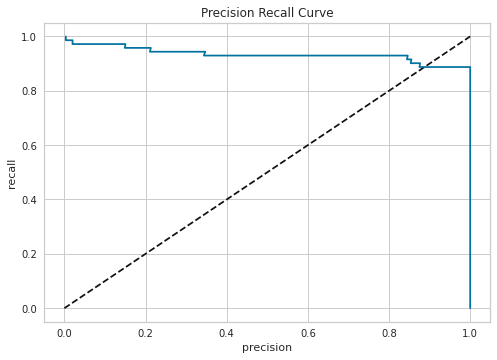

In [199]:
y_pred_proba = dl_tuned.predict(X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(precision, recall)
plt.xlabel('precision')
plt.ylabel('recall')
plt.title('Precision Recall Curve')
plt.show()

In [200]:
cprint('optimal_threshold for precision_recall_curve','green', 'on_red')
print("-----"*10)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_proba)
optimal_idx = np.argmax((2 * precisions * recalls) / (precisions + recalls))  
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

optimal_threshold for precision_recall_curve
--------------------------------------------------


0.9928845

<a id="7.9"></a>
### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.9 Prediction<p>

In [201]:
# dl_tuned.save('neural_network(tuned).h5')

<a id="7.9.1"></a>
#### <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">7.9.1 Loading Model and Scaler<p>

In [202]:
# from tensorflow.keras.models import load_model

In [203]:
# neural_network = load_model('neural_network(tuned).h5')

In [204]:
Actual = pd.DataFrame(y_test)
Actual.head()

,class
109949,0
136682,0
23214,0
181724,0
201060,0


In [205]:
y_pred_proba[:5]

array([[1.59036828e-09],
       [1.89663211e-07],
       [2.89067884e-05],
       [1.07796175e-10],
       [9.13086551e-11]], dtype=float32)

In [206]:
y_pred = (dl_model.predict(X_test) > 0.5).astype("int32")
y_pred[:5]

array([[0],
       [0],
       [0],
       [0],
       [0]], dtype=int32)

In [207]:
cprint('DL_tuned Predictions','green', 'on_red')
DL_pred = pd.DataFrame(y_pred, index = Actual.index)
DL_pred = pd.concat([Actual, DL_pred], axis=1)
DL_pred.rename(columns = {'class':'Actual', 0:'DL_Pred'}, inplace = True)
DL_pred.head()

DL_tuned Predictions


,Actual,DL_Pred
109949,0,0
136682,0,0
23214,0,0
181724,0,0
201060,0,0


In [208]:
DL_pred.sample(10)

,Actual,DL_Pred
170215,0,0
8989,0,0
67163,0,0
158035,0,0
53643,0,0
31540,0,0
224720,0,0
2801,0,0
12913,0,0
196555,0,0


In [209]:
pd.crosstab(DL_pred['Actual'], DL_pred['DL_Pred'])

DL_Pred,0,1
Actual,,
0,45998,130
1,5,66


<a id="8"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">8 - THE COMPARISON OF MODELS<p>

In [210]:
compare = pd.DataFrame({"Model": ["LogReg_Model", "LogReg_Tuned", "RF_Model", "RF_Tuned", "LogRegSmote_Model",
                                  "LogRegSmote_Tuned", "RFSmote_Model", "RFSmote_Tuned", "DL_Model", "DL_Tuned"],
                        
                        "Accuracy_Score": [LogReg_model_acc, LogReg_tuned_acc, RF_model_acc, RF_tuned_acc, LogReg_smote_model_acc,
                                  LogRegSmote_tuned_acc, RF_smote_model_acc, RFSmote_tuned_acc, DL_Acc, DLTuned_Acc],
                        
                        "F1_Score": [LogReg_model_f1, LogReg_tuned_f1, RF_model_f1, RF_tuned_f1, 
                                  LogReg_smote_model_f1, LogRegSmote_tuned_f1, RF_smote_model_f1, RFSmote_tuned_f1, DL_f1,
                                  DLTuned_f1],
                        
                        "Precision_Score": [LogReg_model_pre, LogReg_tuned_pre, RF_model_pre, RF_tuned_pre, LogReg_smote_model_pre,
                                  LogRegSmote_tuned_pre, RF_smote_model_pre, RFSmote_tuned_pre, DL_AP, DLTuned_AP],
                                                 
                        "Recall_Score": [LogReg_model_recall, LogReg_tuned_recall, RF_model_recall, RF_tuned_recall, 
                                  LogReg_smote_model_recall, LogRegSmote_tuned_recall, RF_smote_model_recall, RFSmote_tuned_recall,
                                  DL_rec, DLTuned_rec],
                        
                        "Roc_Auc_Score": [LogReg_model_auc, LogReg_tuned_auc, RF_model_auc, RF_tuned_auc, LogReg_smote_model_auc,
                                  LogRegSmote_tuned_auc, RF_smote_model_auc, RFSmote_tuned_auc, DL_roc_auc, DLTuned_roc_auc],
                       
                        "Recall_Auc_Score": [LogReg_model_recall_auc, LogReg_tuned_recall_auc, RF_model_recall_auc, 
                                  RF_tuned_recall_auc, LogReg_smote_model_recall_auc, LogRegSmote_tuned_recall_auc, 
                                  RF_smote_model_recall_auc, RFSmote_tuned_recall_auc, DL_recall_auc, DLTuned_recall_auc]})
  
    
compare = compare.sort_values(by="Recall_Score", ascending=True)
fig = px.bar(compare, x = "Recall_Score", y = "Model", title = "Recall_Score")
fig.show()

compare = compare.sort_values(by="F1_Score", ascending=True)
fig = px.bar(compare, x = "F1_Score", y = "Model", title = "F1_Score")
fig.show()

compare = compare.sort_values(by="Roc_Auc_Score", ascending=True)
fig = px.bar(compare, x = "Roc_Auc_Score", y = "Model", title = "Roc_Auc_Score")
fig.show()

compare = compare.sort_values(by="Recall_Auc_Score", ascending=True)
fig = px.bar(compare, x = "Recall_Auc_Score", y = "Model", title = "Recall_Auc_Score")
fig.show()

compare = compare.sort_values(by="Precision_Score", ascending=True)
fig = px.bar(compare, x = "Precision_Score", y = "Model", title = "Precision_Score")
fig.show()

compare = compare.sort_values(by="Accuracy_Score", ascending=True)
fig = px.bar(compare, x = "Accuracy_Score", y = "Model", title = "Accuracy_Score")
fig.show()

In [211]:
compare.sort_values(by="Recall_Score", ascending=False)

,Model,Accuracy_Score,F1_Score,Precision_Score,Recall_Score,Roc_Auc_Score,Recall_Auc_Score
6,RFSmote_Model,0.997,0.997,0.999,0.995,0.997,0.998
1,LogReg_Tuned,0.961,0.072,0.037,0.972,0.967,0.504
0,LogReg_Model,0.972,0.094,0.049,0.958,0.965,0.504
9,DL_Tuned,0.994,0.344,0.934,0.958,0.993,0.584
7,RFSmote_Tuned,0.968,0.967,0.999,0.937,0.968,0.984
4,LogRegSmote_Model,0.958,0.957,0.982,0.934,0.958,0.974
5,LogRegSmote_Tuned,0.958,0.957,0.982,0.934,0.958,0.974
8,DL_Model,0.997,0.494,0.922,0.930,0.988,0.633
3,RF_Tuned,0.999,0.706,0.569,0.930,0.964,0.749
2,RF_Model,1.000,0.924,1.000,0.859,0.930,0.930


<a id="9"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">9 - FINAL MODEL<p>
    
For the final model, I will first look at the correlation values of the df_out columns and the feature importance values of the Random Forest Classifier default and tuned models created with SMOTE data above. 

In [212]:
df_out.corr()['class'].sort_values().drop('class').iplot(kind = 'barh', title = 'Correlation Between the Columns');

In [213]:
RFSmote_feature_imp = pd.DataFrame(index=X.columns, data = RF_smote_model.feature_importances_, columns = ['Importance']).sort_values("Importance", ascending = False)

fig = px.bar(RFSmote_feature_imp.sort_values('Importance', ascending = False), x = RFSmote_feature_imp.sort_values('Importance', 
             ascending = False).index, y = 'Importance', title = "RFSmote Feature_Importance", 
             labels = dict(x = "Features", y ="Importance"))
fig.show()

In [214]:
RFSmote_tuned_feature_imp = pd.DataFrame(index=X.columns, data = RFSmote_tuned.feature_importances_, columns = ['Importance']).sort_values("Importance", ascending = False)

fig = px.bar(RFSmote_tuned_feature_imp.sort_values('Importance', ascending = False), x = RFSmote_tuned_feature_imp.sort_values('Importance', 
             ascending = False).index, y = 'Importance', title = "RFSmote_tuned Feature_Importance", 
             labels = dict(x = "Features", y ="Importance"))
fig.show()

Based on the above values, I create the data for my final model with the following columns. 

In [215]:
df_deploy = df_out[['v2', 'v3', 'v4', 'v7', 'v10', 'v11', 'v12', 'v14', 'v16', 'v17', 'class']].copy()
df_deploy.head(1)

,v2,v3,v4,v7,v10,v11,v12,v14,v16,v17,class
0,-0.073,2.536,1.378,0.240,0.091,-0.552,-0.618,-0.311,-0.470,0.208,0


In [216]:
X = df_deploy.drop(['class'], axis = 1)
y = df_deploy['class']

In [217]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

over = SMOTE(sampling_strategy = {1: 10000})
under = RandomUnderSampler(sampling_strategy = {0: 10000})
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps = steps)
X, y = pipeline.fit_resample(X, y)

In [218]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)

In [219]:
print('X_train.shape : ', X_train.shape)
print('X_test.shape  : ', X_test.shape)

X_train.shape :  (16000, 10)
X_test.shape  :  (4000, 10)


In [220]:
cprint('y_train.value_counts','green', 'on_red')
y_train.value_counts()

y_train.value_counts


1    8000
0    8000
Name: class, dtype: int64

In [221]:
cprint('y_test.value_counts','green', 'on_red')
y_test.value_counts()

y_test.value_counts


1    2000
0    2000
Name: class, dtype: int64

I obtained the best parameters with GridSearch above for Logistic Regression and Random Forest Classifier. I want to get a final score by running these models with best parameters and other models with default parameters. 

In [222]:
models = []

models.append(("LogReg_Deploy", LogisticRegression(class_weight = 'balanced',
                                                   penalty = 'l2', 
                                                   solver = 'lbfgs',
                                                   random_state = 42)))
models.append(("RandomForest_Deploy", RandomForestClassifier(class_weight = 'balanced',
                                                             max_depth = 7,
                                                             max_features = 4,
                                                             min_samples_split = 2,
                                                             n_estimators = 50,
                                                             random_state = 42)))
models.append(("KNN_trial", KNeighborsClassifier()))
models.append(("SVC_trial", SVC(class_weight="balanced", random_state=42)))
models.append(("DTC_trial", DecisionTreeClassifier(class_weight="balanced", random_state=42)))
models.append(("ADA_trial", AdaBoostClassifier(random_state=42)))
models.append(("GBC_trial", GradientBoostingClassifier(random_state=42)))
models.append(("XGB_trial", XGBClassifier(random_state=42, verbosity = 0)))
models.append(("LGB_trial", LGBMClassifier(random_state=42)))

# evaluate each model in turn

results = []
names = []
f1_scores = []
recall_scores = []
roc_auc_scores = []

for name, model in models:
        
    kfold = StratifiedKFold(n_splits=10, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring="recall")

    results.append(cv_results)
    names.append(name)

    print(f"{name} MODEL: {round(cv_results.mean(), 4)}")
        
    y_pred = model.fit(X_train, y_train).predict(X_test)

    f1_scores.append(f1_score(y_test, y_pred))
    recall_scores.append(recall_score(y_test, y_pred))
    roc_auc_scores.append(roc_auc_score(y_test, y_pred))    

result_df = pd.DataFrame(results, columns=[i for i in range(1, 11)], index=names).T
result_df.iplot(kind="box", boxpoints="all", title="CV Results")

compare = pd.DataFrame({"F1": f1_scores,
                        "Recall": recall_scores,
                        "ROC AUC": roc_auc_scores                        
                       }, index=names)

for score in compare.columns:
    compare[score].sort_values().iplot(kind="barh", title=f"{score} Score")
    
compare

LogReg_Deploy MODEL: 0.906
RandomForest_Deploy MODEL: 0.9522
KNN_trial MODEL: 0.9978
SVC_trial MODEL: 0.885
DTC_trial MODEL: 0.982
ADA_trial MODEL: 0.9392
GBC_trial MODEL: 0.9584
XGB_trial MODEL: 0.9938
LGB_trial MODEL: 0.9909


,F1,Recall,ROC AUC
LogReg_Deploy,0.936,0.900,0.939
RandomForest_Deploy,0.968,0.945,0.969
KNN_trial,0.992,0.999,0.992
SVC_trial,0.936,0.883,0.940
DTC_trial,0.984,0.983,0.984
ADA_trial,0.960,0.944,0.961
GBC_trial,0.970,0.953,0.971
XGB_trial,0.996,0.996,0.996
LGB_trial,0.997,0.997,0.997


The scores of the other models I ran with the default parameters are very good.
However, I'll go with Logistic Regression and Random Forest Classifier for model deployment. 

**Final Model with Logistic Regression (With Feature Importance and SMOTE)**

LogReg_Deploy
------------------
[[1954   46]
 [ 199 1801]]
Test_Set
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2000
           1       0.98      0.90      0.94      2000

    accuracy                           0.94      4000
   macro avg       0.94      0.94      0.94      4000
weighted avg       0.94      0.94      0.94      4000

Train_Set
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      8000
           1       0.97      0.91      0.94      8000

    accuracy                           0.94     16000
   macro avg       0.94      0.94      0.94     16000
weighted avg       0.94      0.94      0.94     16000

------------------------------------------------------------


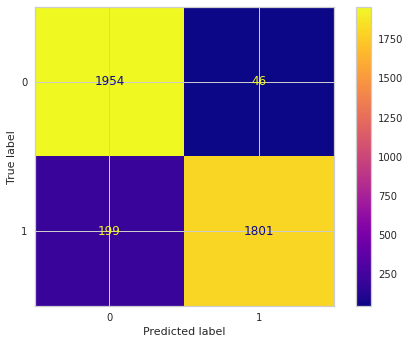

In [223]:
LogReg_Deploy = LogisticRegression(class_weight = 'balanced',
                                         penalty = 'l2', 
                                         solver = 'lbfgs',
                                         random_state = 42).fit(X_train, y_train)

y_pred = LogReg_Deploy.predict(X_test)
y_train_pred = LogReg_Deploy.predict(X_train)

LogReg_Deploy_f1 = f1_score(y_test, y_pred)
LogReg_Deploy_acc = accuracy_score(y_test, y_pred)
LogReg_Deploy_recall = recall_score(y_test, y_pred)
LogReg_Deploy_auc = roc_auc_score(y_test, y_pred)
LogReg_Deploy_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
LogReg_Deploy_recall_auc = auc(recall, precision)

print("LogReg_Deploy")
print ("------------------")
eval(LogReg_Deploy, X_train, X_test)

**Final Model with Random Forest Classifier (With Feature Importance and SMOTE)**

RandomForest_Deploy
------------------
[[1986   14]
 [ 110 1890]]
Test_Set
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      2000
           1       0.99      0.94      0.97      2000

    accuracy                           0.97      4000
   macro avg       0.97      0.97      0.97      4000
weighted avg       0.97      0.97      0.97      4000

Train_Set
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      8000
           1       1.00      0.96      0.98      8000

    accuracy                           0.98     16000
   macro avg       0.98      0.98      0.98     16000
weighted avg       0.98      0.98      0.98     16000

------------------------------------------------------------


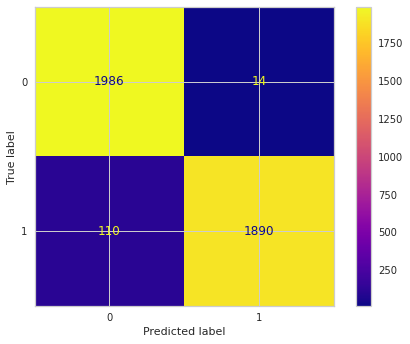

In [224]:
RandomForest_Deploy = RandomForestClassifier(class_weight = 'balanced',
                                       max_depth = 7,
                                       max_features = 4,
                                       min_samples_split = 2,
                                       n_estimators = 50,
                                       random_state = 42).fit(X_train, y_train)

y_pred = RandomForest_Deploy.predict(X_test)
y_train_pred = RandomForest_Deploy.predict(X_train)

RandomForest_Deploy_f1 = f1_score(y_test, y_pred)
RandomForest_Deploy_acc = accuracy_score(y_test, y_pred)
RandomForest_Deploy_recall = recall_score(y_test, y_pred)
RandomForest_Deploy_auc = roc_auc_score(y_test, y_pred)
RandomForest_Deploy_pre = precision_score(y_test, y_pred)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
RandomForest_Deploy_recall_auc = auc(recall, precision)

print("RandomForest_Deploy")
print ("------------------")
eval(RandomForest_Deploy, X_train, X_test)

<a id="11"></a>
## <p style="background-color:#B61151; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;">11 - CONCLUSION<p>

The datasets contains transactions made by credit cards in September 2013 by european cardholders. A study is requested from us to predict which transaction is fraudulent or not by using this data.

First of all, to observe the structure of the data, outliers, missing values and features that affect the target variable, we used exploratory data analysis and data visualization techniques.

Then, we performed data pre-processing operations to increase the recall score of algorithms.** 

We built models to predict transaction is fraudulent or not. We trained our models with train set, tested the success of models with test set. 

In this study, we made modelling with ***Logistic Regression***, ***Random Forest Classifier*** and ***Neural Network***.

We used scikit-learn ***Confusion Metrics*** module for accuracy calculation and the ***Yellowbrick*** module for model selection and visualization.

Implementing SMOTE Technique on our imbalanced dataset helped us to balanced the data.

After comparison between models, we found that RandomForestClassifier (Befor and After) SMOTE gave us the best result.

I chose the 10 most effective feature according to the correlation, and feature importance results. With these 10 feature and target feature, I create a new dataframe. With this dataframe, I made modelling with Logistic Regression and Random Forest Classifier with SMOTE.

I save  Logistic Regression and Random Forest Classifier as a final model.